In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import pandas as pd
import seaborn as sns

sns.set_theme(context='talk', 
              style='whitegrid', 
              palette='Set2',
              font_scale=1.4, 
              rc={'figure.figsize': (14, 6)})

import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import plotly
pio.templates.default = 'seaborn+presentation'



import scipy.constants as sc

hbarc = sc.hbar*sc.speed_of_light/sc.giga/sc.electron_volt / sc.femto

In [3]:
import sys
sys.path.append('../src')

In [4]:
from luscher_lib import Luscher_zeta, Kcot_luscher

# load data

In [5]:
df_conf = pd.read_csv('../data/CLS_conf_inf.csv')
df_conf['a2 [fm2]'] = df_conf['a [fm]'].apply(lambda x: x**2)
df_conf['a_inv [GeV]'] = (hbarc / df_conf['a [fm]']).round(3) # add lattice unit
df_conf

,Label,N_f,beta,kappa,size_L,size_T,bdy.cond.,a [fm],m_pi [MeV],L [fm],m_pi L,m_B [GeV],N_conf,N_tsrc,N_meas,N_LapH,a2 [fm2],a_inv [GeV]
0,N300,3,3.70,0.137000,48,128,open,0.0498,422,2.4,5.1,1.19,2047,12,24564,32,0.002480,3.962
1,N202,3,3.55,0.137000,48,128,open,0.0642,412,3.1,6.4,1.17,899,8,10788,68,0.004122,3.074
2,H200,3,3.55,0.137000,32,96,open,0.0642,419,2.1,4.4,1.19,2000,8,16000,20,0.004122,3.074
3,B450,3,3.46,0.136890,32,64,periodic,0.0762,417,2.4,5.2,1.18,1612,8,25762,32,0.005806,2.590
4,H101,3,3.40,0.136760,32,96,open,0.0865,417,2.8,5.9,1.16,2016,4,12096,48,0.007482,2.281
5,U103,3,3.40,0.136760,24,128,open,0.0865,414,2.1,4.4,1.18,5658,5,45264,20,0.007482,2.281
6,A653,3,3.34,0.136572,24,48,periodic,0.0992,424,2.4,5.1,1.16,5050,4,40400,32,0.009841,1.989
7,E5,2,5.30,0.136250,32,64,periodic,0.0658,436,2.1,4.7,1.29,2000,4,16000,30,0.004330,2.999
8,E1,2,5.30,0.135500,32,64,periodic,0.0658,978,2.1,10.4,2.03,168,8,2688,30,0.004330,2.999


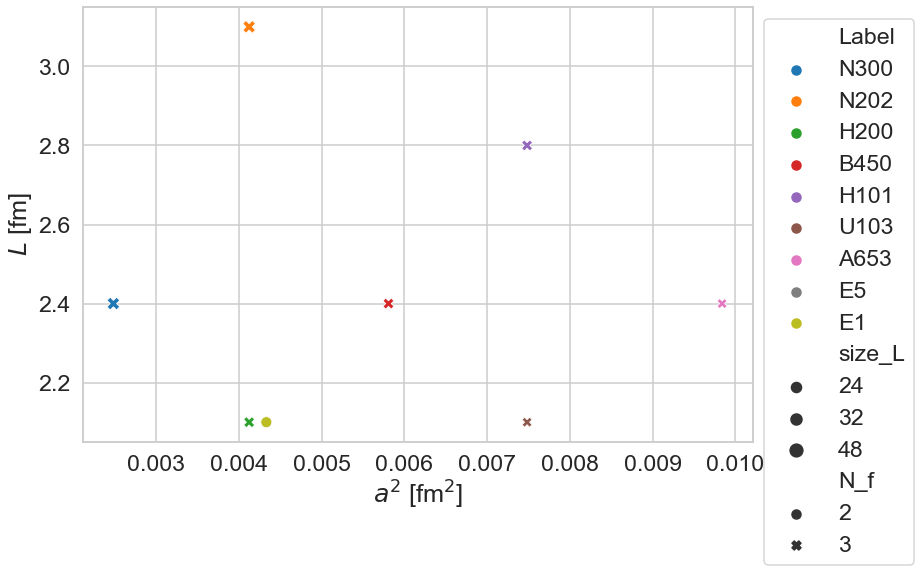

In [6]:
with sns.color_palette('tab10'):
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.scatterplot(data=df_conf, x='a2 [fm2]', y='L [fm]', hue='Label', ax=ax, size='size_L', style='N_f', size_norm=(0,48))
    ax.legend(loc='upper left', bbox_to_anchor=(1,1))
    ax.set(xlabel=r'$a^2$ [fm$^2$]', ylabel='$L$ [fm]')

In [7]:
# for utility
lat_unit_dic = df_conf.set_index('Label')['a [fm]'].to_dict()
a_inv_dic = df_conf.set_index('Label')['a_inv [GeV]'].to_dict()
L_fm_dic = df_conf.set_index('Label')['L [fm]'].to_dict()
L_dic = df_conf.set_index('Label')['size_L'].to_dict()
pion_mass_dic = df_conf.set_index('Label')['m_pi [MeV]'].to_dict()
baryon_mass_dic = df_conf.set_index('Label')['m_B [GeV]'].to_dict()
label_list = list(df_conf['Label'])

In [8]:
df_p2 = pd.read_csv('../data/p_square_spin_zero.csv')

In [9]:
df_p2

,label,frame,level,p^2 [GeV^2],p^2 (95CI lower)[GeV^2],p^2 (95CI upper)[GeV^2]
0,N300,P000,0,-0.052776,-0.058083,-0.047491
1,N300,P000,1,0.220941,0.215210,0.226353
2,N300,P000,2,0.530439,0.523077,0.537480
3,N300,P001,0,-0.004604,-0.010711,0.000879
4,N300,P001,1,0.289442,0.281795,0.297300
...,...,...,...,...,...,...
85,E1,P011,0,-0.013906,-0.028521,0.001363
86,E1,P011,1,0.155614,0.145779,0.164732
87,E1,P111,0,0.021042,-0.007314,0.052523
88,E1,P111,1,0.208173,0.193195,0.223386


In [10]:
label_list = ['N300', 'N202', 'H200', 'B450', 'H101', 'U103', 'A653', 'E1', 'E5']

In [11]:
len(df_p2)

90

In [12]:
class LD(object):
    def __init__(self, label, frame, level, p2GeV2, p2GeV2_min, p2GeV2_max):
        self.label = label
        self.frame = frame
        self.d = [int(frame[1]), int(frame[2]), int(frame[3])]
        self.L = L_dic.get(label)
        self.lat_unit = lat_unit_dic.get(label)
        self.a_inv = a_inv_dic.get(label)
        self.m_B = baryon_mass_dic.get(label)/self.a_inv
        self.m_pi = pion_mass_dic.get(label)/self.a_inv * 1e-3
        
        self.kcs = Kcot_luscher(self.L, self.m_B, self.m_B, d=self.d)
        
        self.k2 = p2GeV2 / self.a_inv**2
        self.k2_max = p2GeV2_max / self.a_inv**2
        self.k2_min = p2GeV2_min / self.a_inv**2
        
        # error bar
        self.k2mpi2s = np.linspace(self.k2_min/self.m_pi**2, self.k2_max/self.m_pi**2)
        self.kcot_mpis = np.array([self.kcs.kcot(k2 * self.m_pi**2)/self.m_pi for k2 in self.k2mpi2s])
        # central value
        self.k2mpi2 = self.k2 / self.m_pi**2
        self.kcot_mpi = self.kcs.kcot(self.k2) / self.m_pi
        
    def generate_reference_line(self, k2mpi2_ref):
        self.k2mpi2_ref = k2mpi2_ref
        self.kcot_mpi_ref = np.array([self.kcs.kcot(k2 * self.m_pi**2)/self.m_pi for k2 in k2mpi2_ref])
        
        return self.kcot_mpi_ref
        
        


In [13]:
ld_dic = {}

In [14]:
def calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, -0.01), xlim=None, ylim=None):
    label, frame, level, p2GeV2, p2GeV2_min, p2GeV2_max = df_p2.query('label == @label & frame == @frame & level == @level').values[0]
    ld = LD(label, frame, level, p2GeV2, p2GeV2_min, p2GeV2_max)
    _ = ld.generate_reference_line(xrefs)

    fig, ax = plt.subplots()


    c = 'C1'
    ax.plot(ld.k2mpi2s, ld.kcot_mpis, color=c, zorder=3, lw=5, label=f'{label} ({frame}) {level}')
    ax.plot(ld.k2mpi2, ld.kcot_mpi, 'o', ms=25, color=c, zorder=3)
    ax.plot(ld.k2mpi2_ref, ld.kcot_mpi_ref, ls='--', color='grey')


    xbs = np.concatenate([np.linspace(-0.5, -1e-1), np.linspace(-1e-1, -1e-5)])
    ax.plot(xbs, - np.sqrt(-xbs), color='black', ls='-')

    ax.legend()
    ax.axhline(0, color='black')
    ax.axvline(0, color='black')
    ax.set(xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$')
    if xlim:
        ax.set(xlim=xlim)
    if ylim:
        ax.set(ylim=ylim)
    
    return ld

# N300 --- $L = 2.4$ fm & $a = 0.0498$ fm

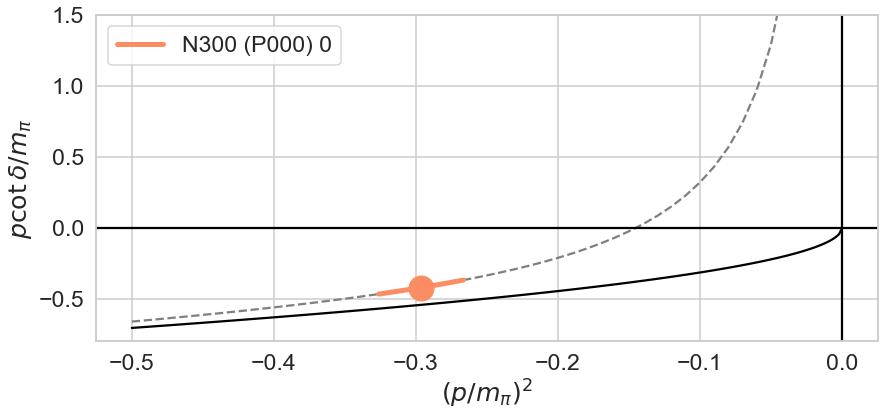

In [15]:
label = 'N300'
frame = 'P000'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, ylim=(-0.8, 1.5))

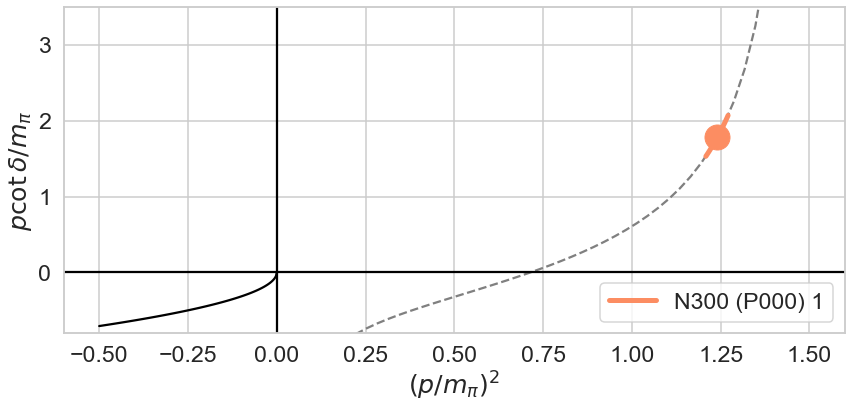

In [16]:
label = 'N300'
frame = 'P000'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(1e-2, 1.5), ylim=(-0.8, 3.5))

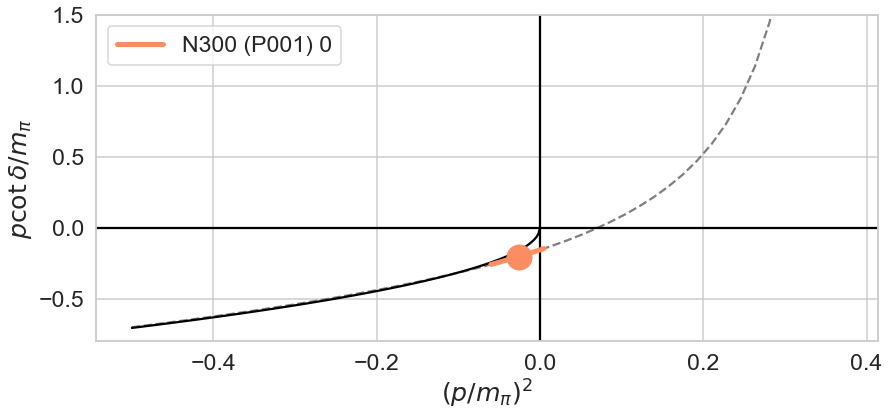

In [17]:
label = 'N300'
frame = 'P001'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.37), ylim=(-0.8, 1.5))

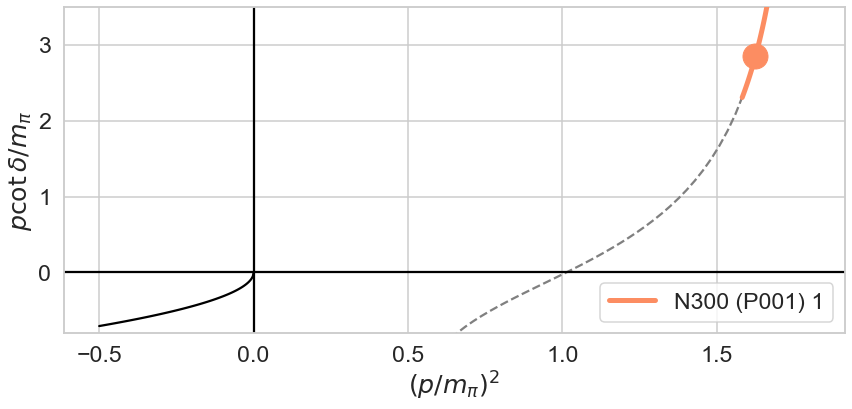

In [18]:
label = 'N300'
frame = 'P001'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.5, 1.8), ylim=(-0.8, 3.5))

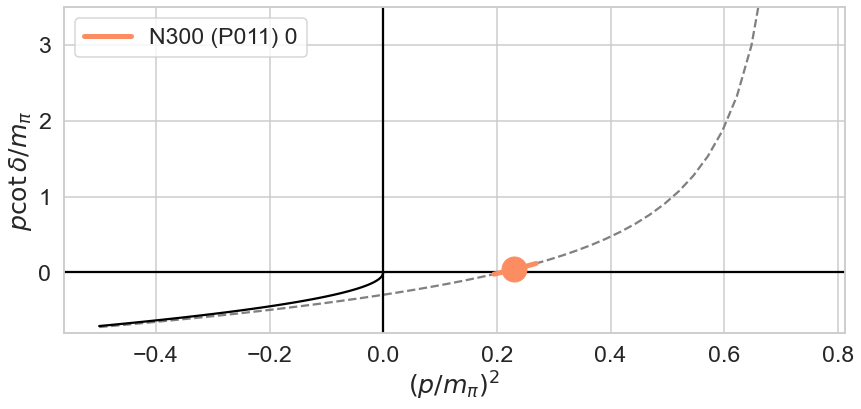

In [19]:
label = 'N300'
frame = 'P011'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.75), ylim=(-0.8, 3.5))

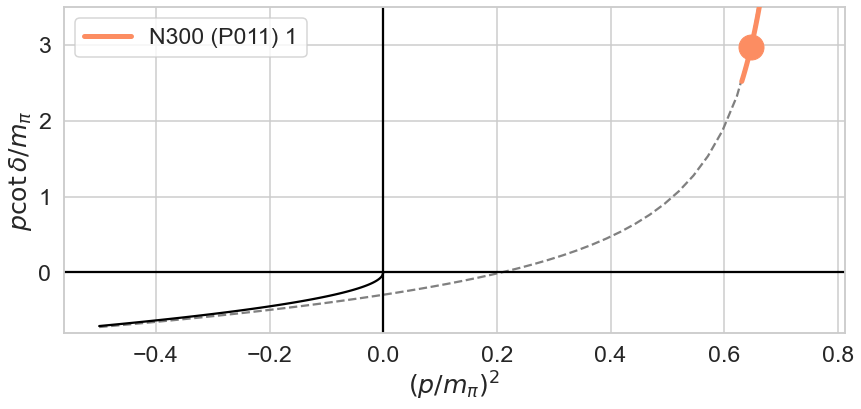

In [20]:
label = 'N300'
frame = 'P011'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.75), ylim=(-0.8, 3.5))

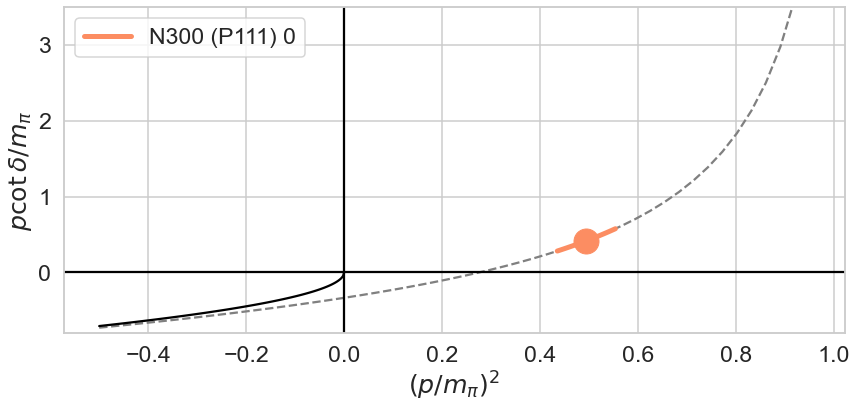

In [21]:
label = 'N300'
frame = 'P111'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.95), ylim=(-0.8, 3.5))

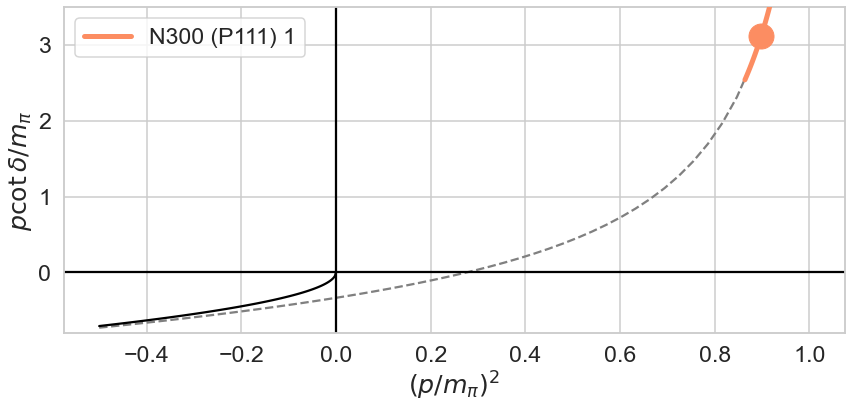

In [22]:
label = 'N300'
frame = 'P111'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 1.0), ylim=(-0.8, 3.5))

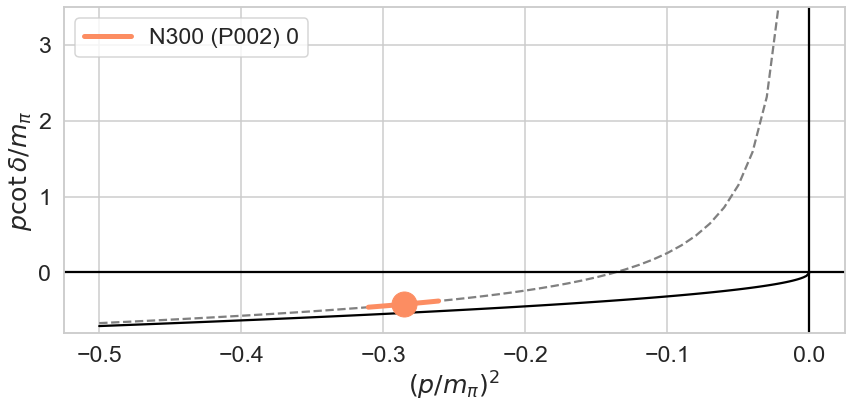

In [23]:
label = 'N300'
frame = 'P002'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, ylim=(-0.8, 3.5))

## plot pcot vs p2

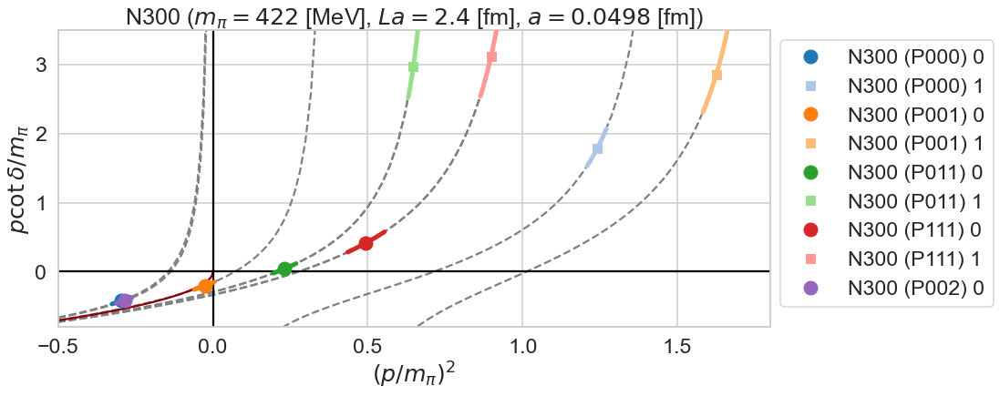

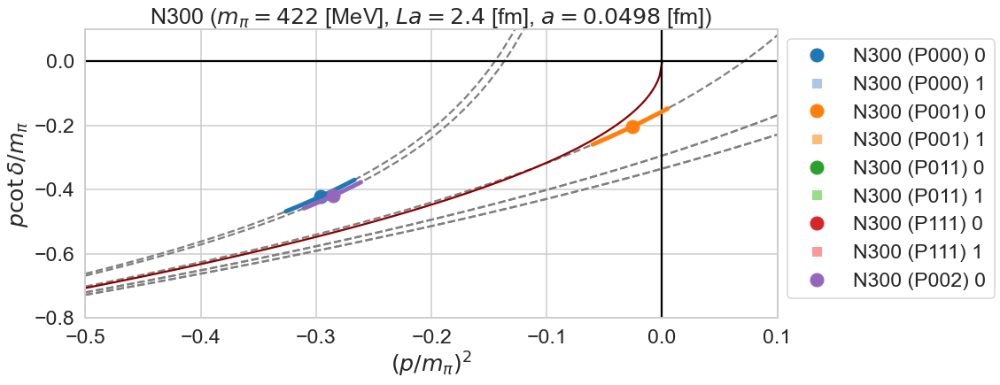

In [24]:
def save_pcot_vs_p2(ld_dic, label0='N300', fit_param_list=[((-0.5,1.8),(-0.8,3.5),''), ((-0.5,0.1),(-0.8,0.1), '_neg')]):
    """
    Parameters
    ----------
    ld_dic
    label0 : ex. 'N300'
    fit_param_list : list of tuple (xlim,ylim,suffix)
    
    """

    cm = list(sns.color_palette('tab20'))
    
    def _plot_fig(xlim, ylim, suffix=''):
        fig, ax = plt.subplots()

        
        col = 0
        for ith, key in enumerate(ld_dic.keys()):
            if key[0] != label0:
                continue

            label, frame, level = key

            ld = ld_dic[(label, frame, level)]
            c = cm[col] # f'C{ith}'
            col += 1
            ax.plot(ld.k2mpi2s, ld.kcot_mpis, color=c, zorder=3, lw=5)
            sym = {0: 'o', 1: 's', 2: '^'}[level]
            ms = {0: 15, 1: 10, 2: 5}[level]
            ax.plot(ld.k2mpi2, ld.kcot_mpi, sym, ms=ms, color=c, zorder=3, label=f'{label} ({frame}) {level}')
            ax.plot(ld.k2mpi2_ref, ld.kcot_mpi_ref, ls='--', color='grey')


        xbs = np.concatenate([np.linspace(-0.75, -1e-1), np.linspace(-1e-1, -1e-5)])
        ax.plot(xbs, - np.sqrt(-xbs), color='darkred', ls='-')

        ax.legend(loc='upper left', bbox_to_anchor=(1,1))
        ax.axhline(0, color='black')
        ax.axvline(0, color='black')
        ax.set(ylim=ylim, xlim=xlim, xlabel=r'$(p/m_\pi)^2$', ylabel=r'$p\cot\delta/m_\pi$',
              title=rf'{label} ($m_\pi = {pion_mass_dic.get(label)}$ [MeV], $La = {L_fm_dic.get(label)}$ [fm], $a = {lat_unit_dic.get(label)}$ [fm])')

        fig.savefig(f'../figs/pcot_vs_p2/{label}_pcot_vs_p2{suffix}.png', bbox_inches='tight') # , transparent=True)
    
    for prm in fit_param_list:
        _plot_fig(xlim=prm[0], ylim=prm[1], suffix=prm[2])
        
save_pcot_vs_p2(ld_dic, label0='N300')

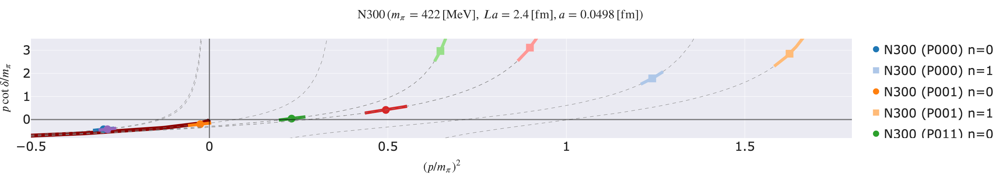

In [25]:
label0 = 'N300'

def plotly_pcot_vs_p2(ld_dic, label0='N300', xlim=(-0.5,1.8), ylim=(-0.8,3.5)):

    fig = go.Figure()

    color_list = list(sns.color_palette('tab20'))
    rgb = lambda x: f'rgb({x[0]*255},{x[1]*255},{x[2]*255})'


    xbs = np.concatenate([np.linspace(-0.75, -0.1), np.linspace(-0.1,-1e-5)])
    fig.add_trace(
        go.Scatter(x=xbs, y=-np.sqrt(-xbs), mode='lines',
                  line=dict(color='darkred', width=10), name='bound state condition', showlegend=False)
    )

    col = 0
    for ith, key in enumerate(ld_dic.keys()):        
        label, frame, level = key
        if label != label0:
            continue

        ld = ld_dic[(label, frame, level)]

        sym={0:'circle', 1:'square', 2:'triangle-up'}[level]

        c = rgb(color_list[col])
        col += 1
        lbl = f'{label} ({frame}) n={level}'
        fig.add_traces(
            [
                go.Scatter(x=ld.k2mpi2_ref, y=ld.kcot_mpi_ref, mode='lines',
                            line=dict(dash='dash', color='gray', width=1), legendgroup=lbl, name='FV constraints', showlegend=False,
                           hovertemplate='(%{x:.3f}, %{y:.3f})'
                          ),
                go.Scatter(x=[ld.k2mpi2], y=[ld.kcot_mpi], mode='markers',
                           hovertemplate=lbl+'<br>(%{x:.3f}, %{y:.3f})', showlegend=True,
                            marker=dict(color=c, size=20, symbol=sym), legendgroup=lbl, name=lbl),
                go.Scatter(x=ld.k2mpi2s, y=ld.kcot_mpis, mode='lines',
                          line=dict(color=c, width=8), legendgroup=lbl, name='95CI',
                          hovertemplate='(%{x:.3f}, %{y:.3f})', showlegend=False)
            ]
        )


    fig.add_hline(y=0, line_width=3)
    fig.add_vline(x=0, line_width=3)

    fig.update_layout(
        title=f'$\LARGE{{\mathrm{{{label0}}} \ (m_\pi = {pion_mass_dic.get(label)} \ [\mathrm{{MeV}}], \ La = {L_fm_dic.get(label0)} \ [\mathrm{{fm}}], a = {lat_unit_dic.get(label0)} \ [\mathrm{{fm}}])}}$',
        xaxis_title='$\LARGE{(p/m_\pi)^2}$', 
                     yaxis_title='$\LARGE{p\cot\delta/m_\pi}$',
                     xaxis_range=xlim, yaxis_range=ylim,
                     font=dict(size=32))
    fig.write_html(f'../figs/pcot_vs_p2/{label0}_pcot_vs_p2.html', include_mathjax='cdn', include_plotlyjs='cdn')
    return fig
    
plotly_pcot_vs_p2(ld_dic, label0='N300')

# B450 --- $L = 2.4$ fm & $a = 0.0642$ fm

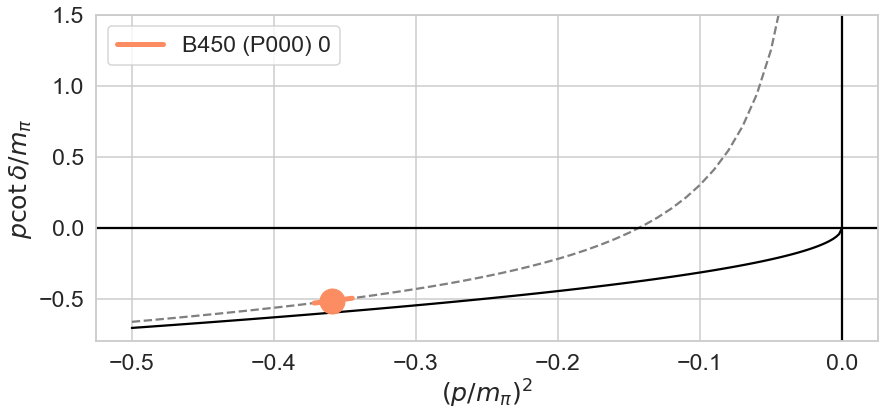

In [26]:
label = 'B450'
frame = 'P000'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, ylim=(-0.8, 1.5))

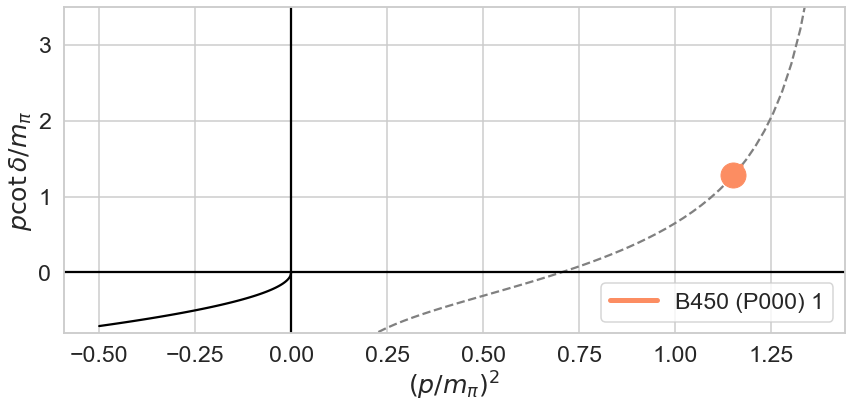

In [27]:
label = 'B450'
frame = 'P000'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.2, 1.35), ylim=(-0.8, 3.5))

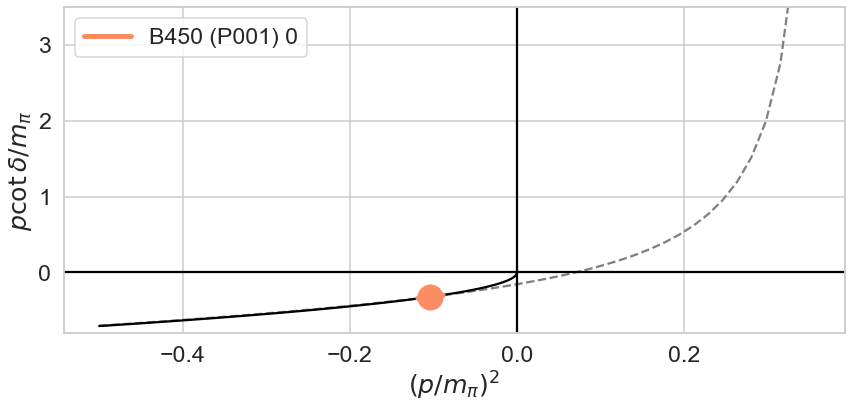

In [28]:
label = 'B450'
frame = 'P001'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.35),
                                                ylim=(-0.8, 3.5))

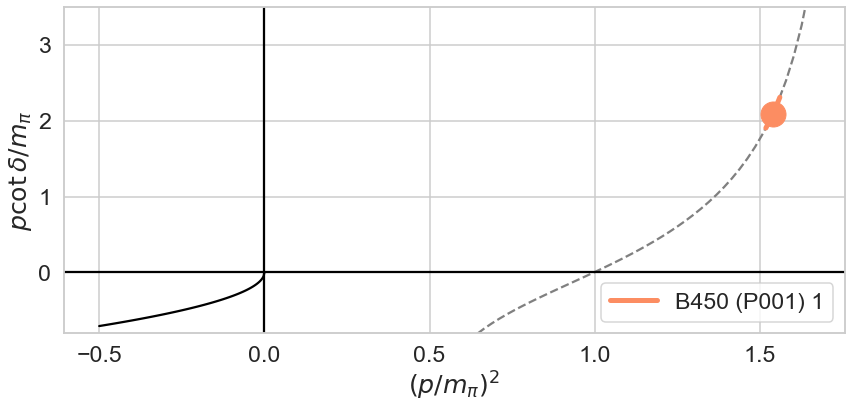

In [29]:
label = 'B450'
frame = 'P001'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.5, 1.65),
                                                ylim=(-0.8, 3.5))

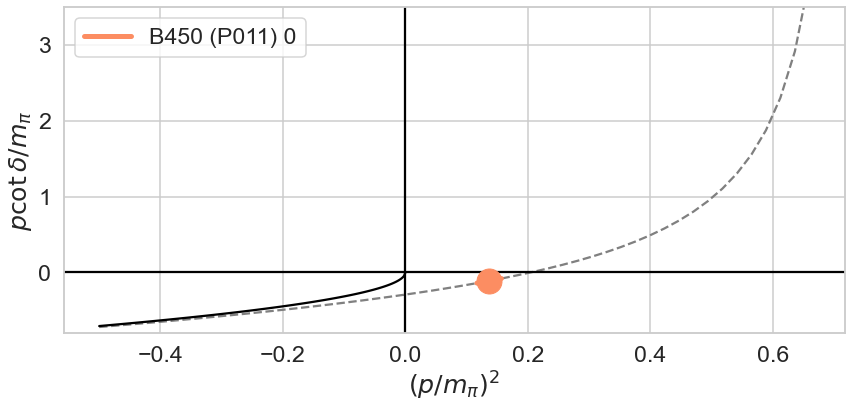

In [30]:
label = 'B450'
frame = 'P011'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.66),
                                                ylim=(-0.8, 3.5))

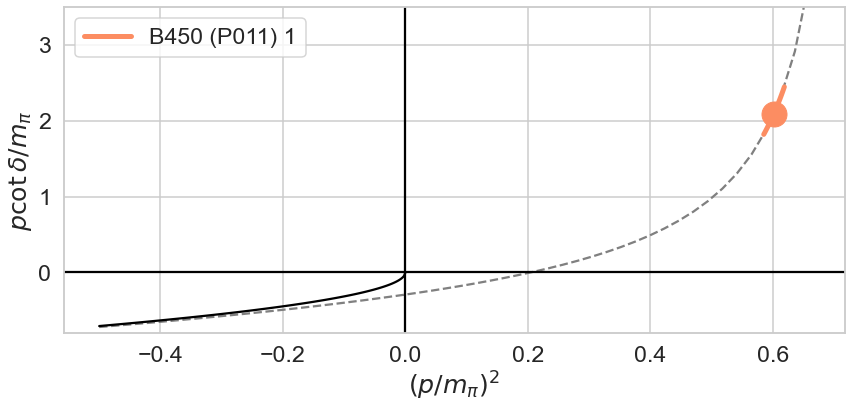

In [31]:
label = 'B450'
frame = 'P011'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.66),
                                                ylim=(-0.8, 3.5))

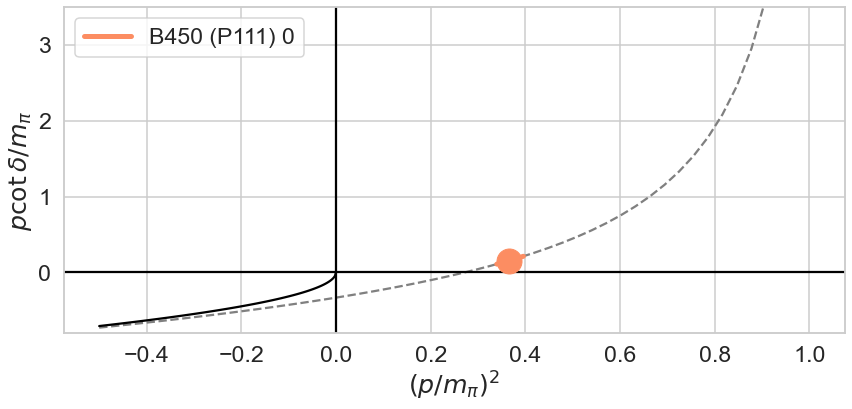

In [32]:
label = 'B450'
frame = 'P111'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 1.0),
                                                ylim=(-0.8, 3.5))

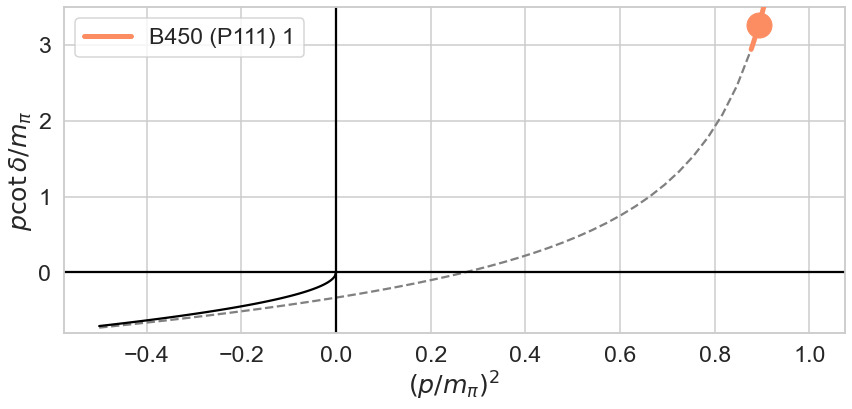

In [33]:
label = 'B450'
frame = 'P111'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 1.0),
                                                ylim=(-0.8, 3.5))

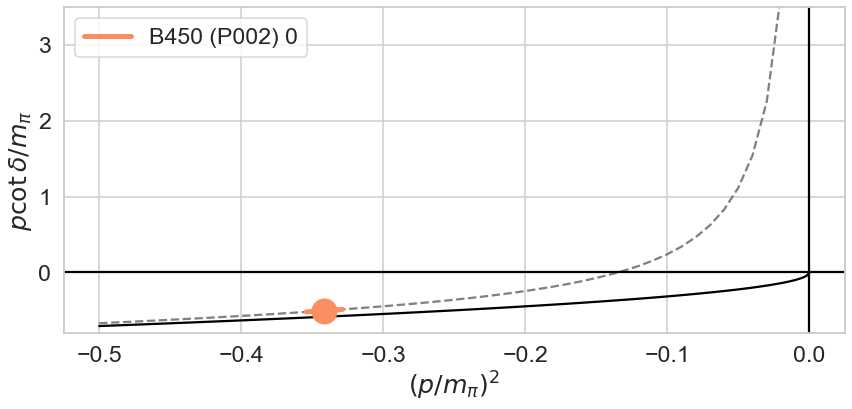

In [34]:
label = 'B450'
frame = 'P002'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, -0.01),
                                                ylim=(-0.8, 3.5))

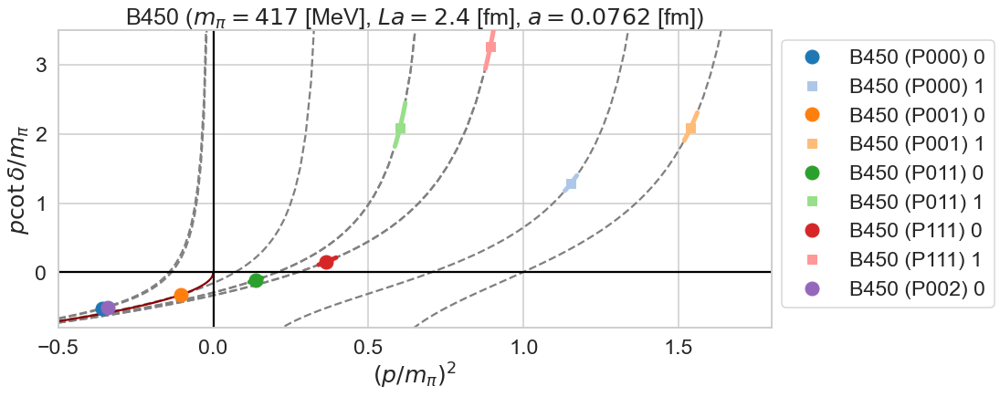

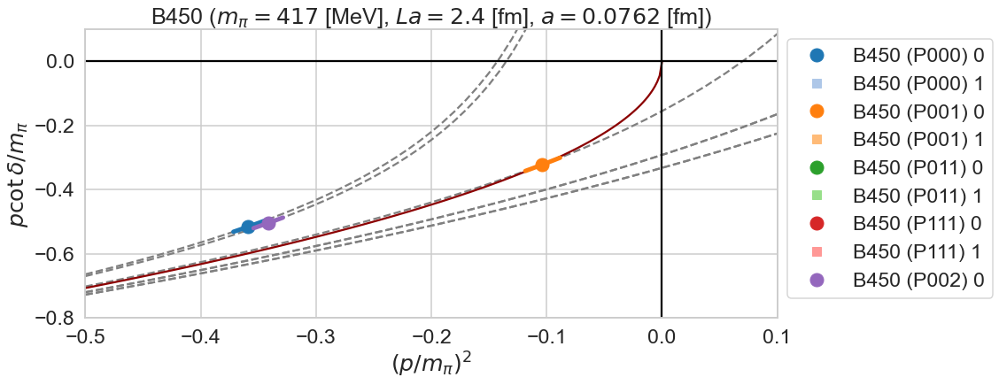

In [35]:
save_pcot_vs_p2(ld_dic, label0='B450')

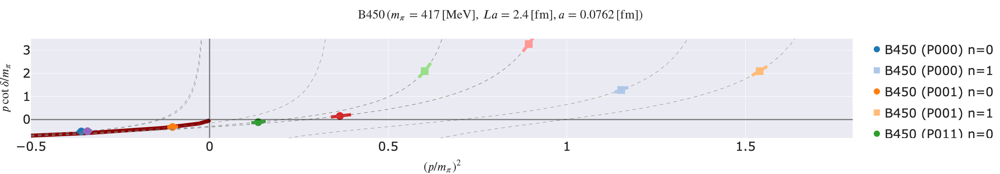

In [36]:
plotly_pcot_vs_p2(ld_dic, label0='B450')

# A653 --- $L = 2.4$ fm & $a = 0.0992$ fm

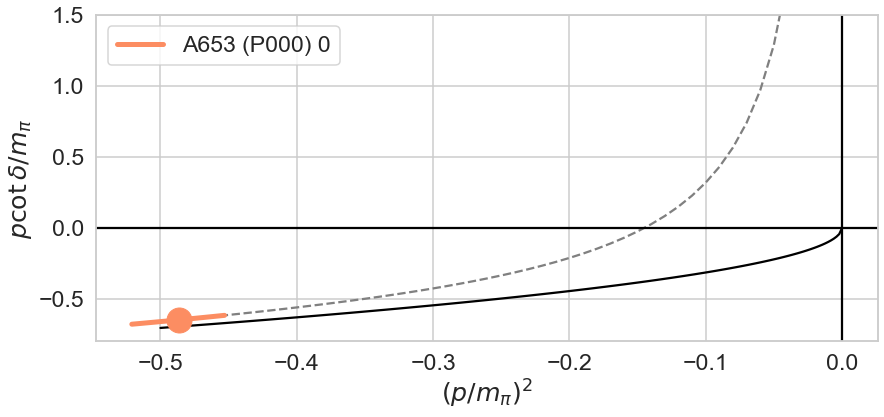

In [37]:
label = 'A653'
frame = 'P000'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, ylim=(-0.8, 1.5))

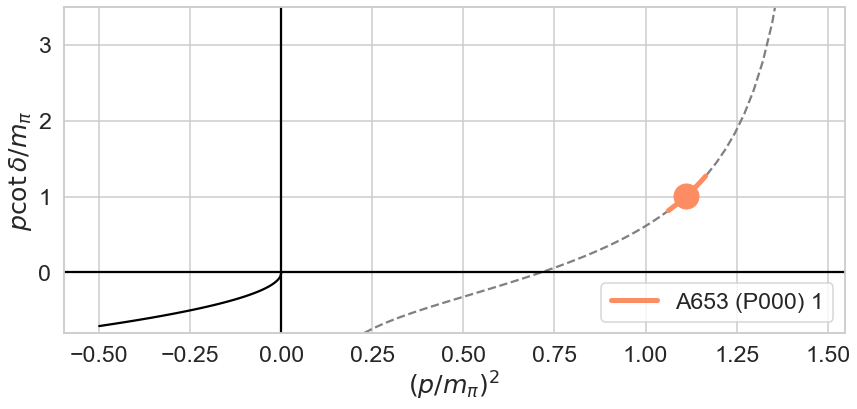

In [38]:
label = 'A653'
frame = 'P000'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.2, 1.45), ylim=(-0.8, 3.5))

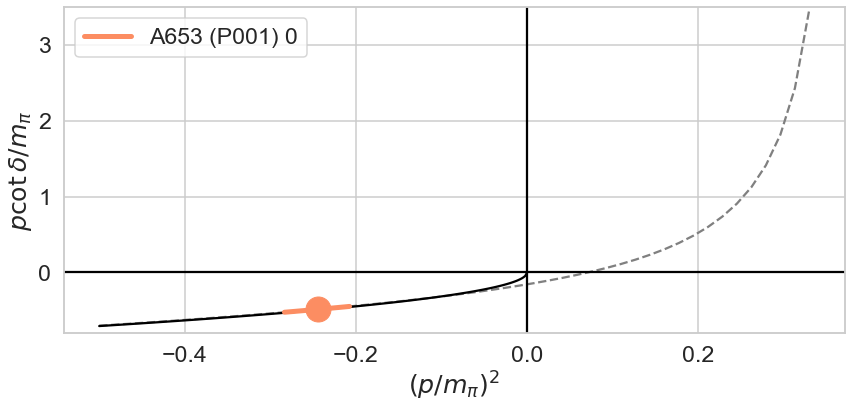

In [39]:
label = 'A653'
frame = 'P001'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.33), ylim=(-0.8, 3.5))

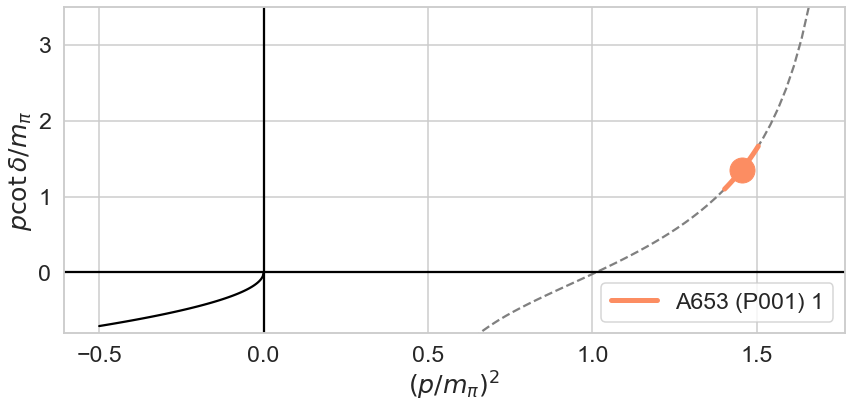

In [40]:
label = 'A653'
frame = 'P001'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.5, 1.66), ylim=(-0.8, 3.5))

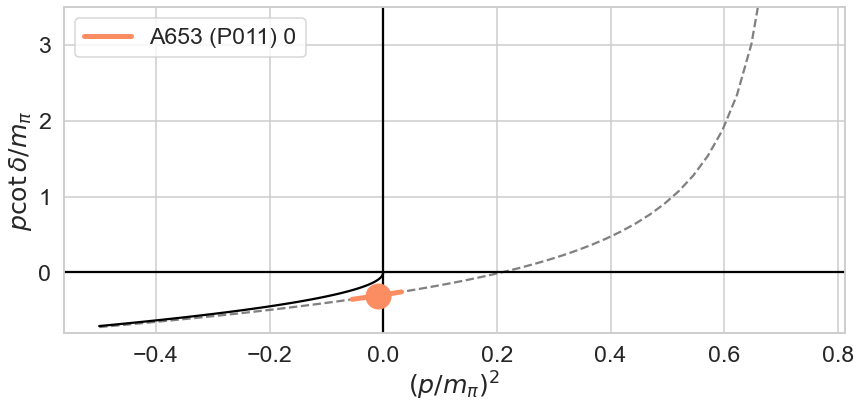

In [41]:
label = 'A653'
frame = 'P011'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.75), ylim=(-0.8, 3.5))

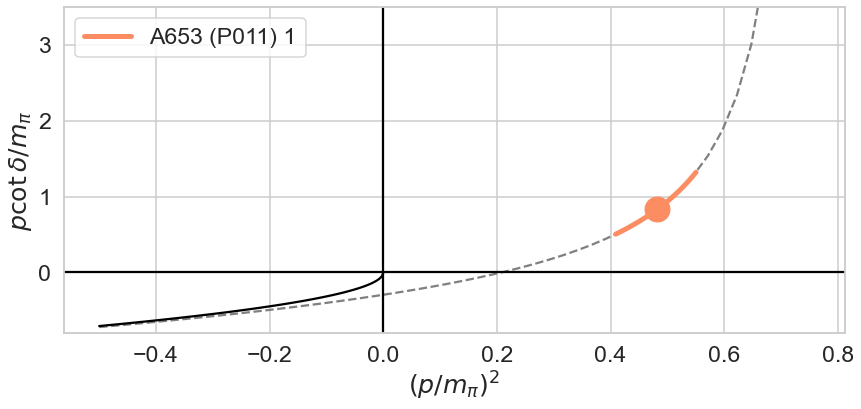

In [42]:
label = 'A653'
frame = 'P011'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.75), ylim=(-0.8, 3.5))

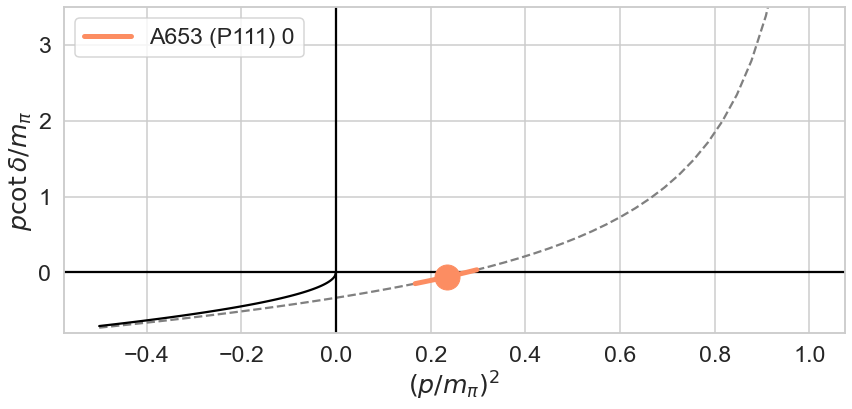

In [43]:
label = 'A653'
frame = 'P111'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 1.0), ylim=(-0.8, 3.5))

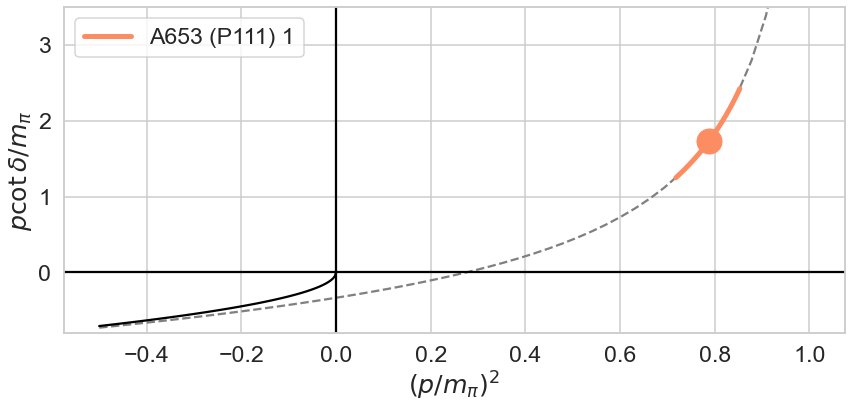

In [44]:
label = 'A653'
frame = 'P111'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 1.0), ylim=(-0.8, 3.5))

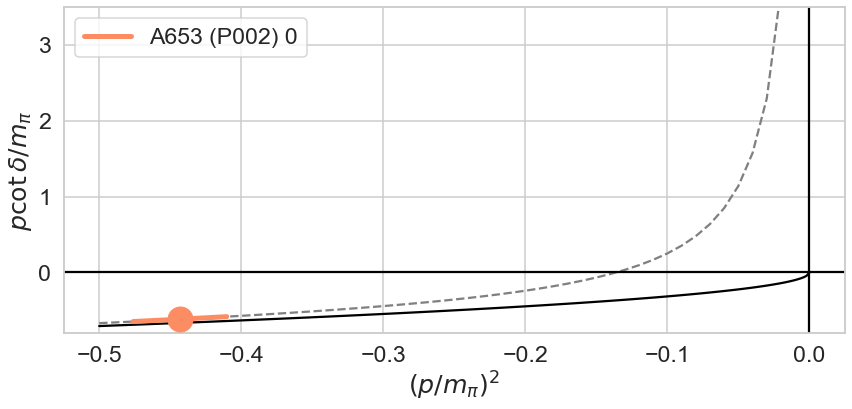

In [45]:
label = 'A653'
frame = 'P002'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, ylim=(-0.8, 3.5))

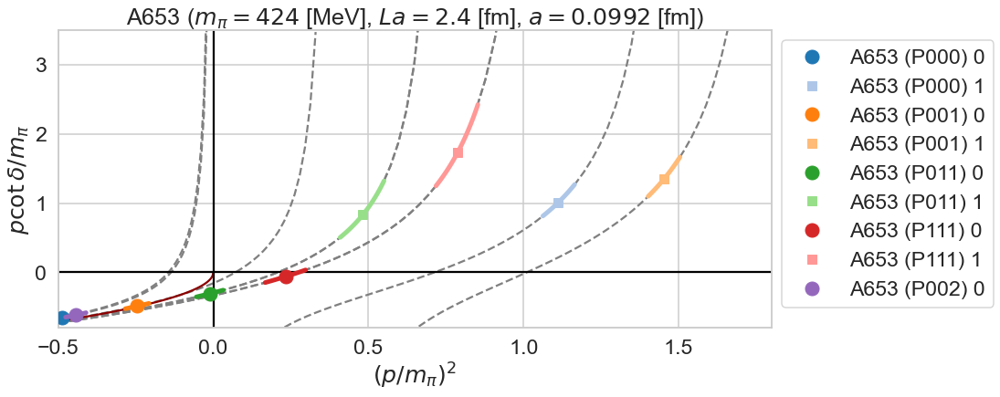

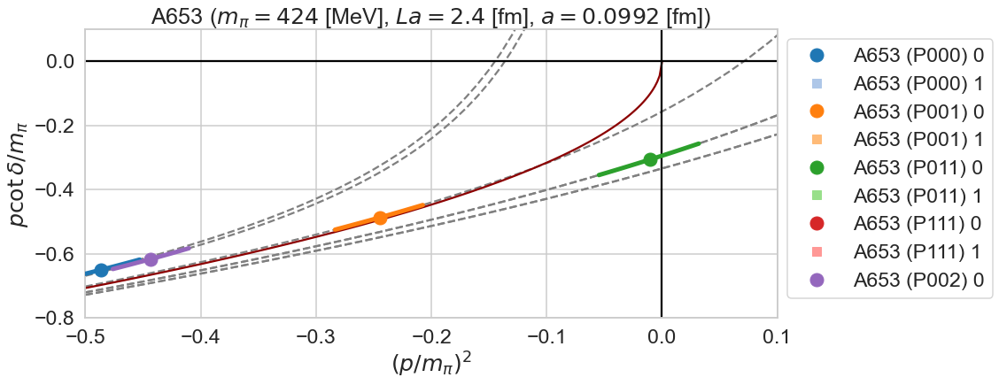

In [46]:
save_pcot_vs_p2(ld_dic, label0='A653')

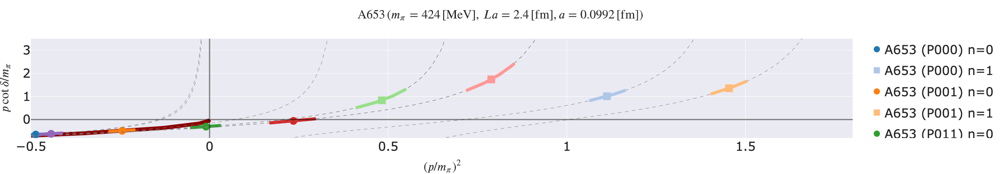

In [47]:
plotly_pcot_vs_p2(ld_dic, label0='A653')

# N202 --- $L = 3.1$ fm & $a = 0.0642$ fm

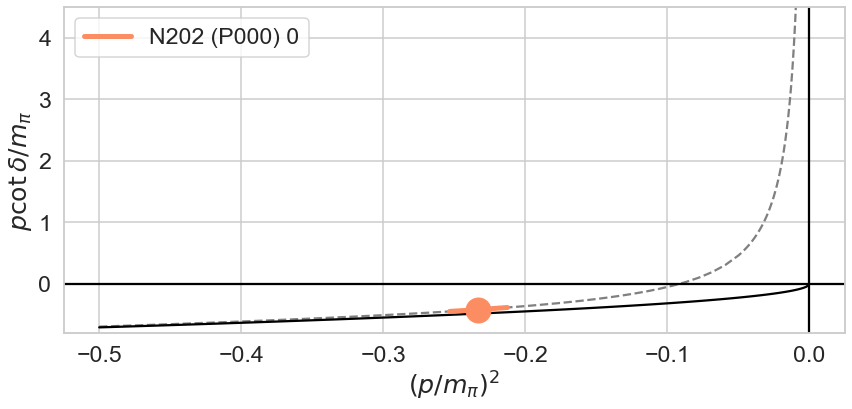

In [48]:
label = 'N202'
frame = 'P000'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.concatenate([np.linspace(-0.5, -0.05),
                                                                                           np.linspace(-0.05,-1e-3)]), ylim=(-0.8, 4.5))

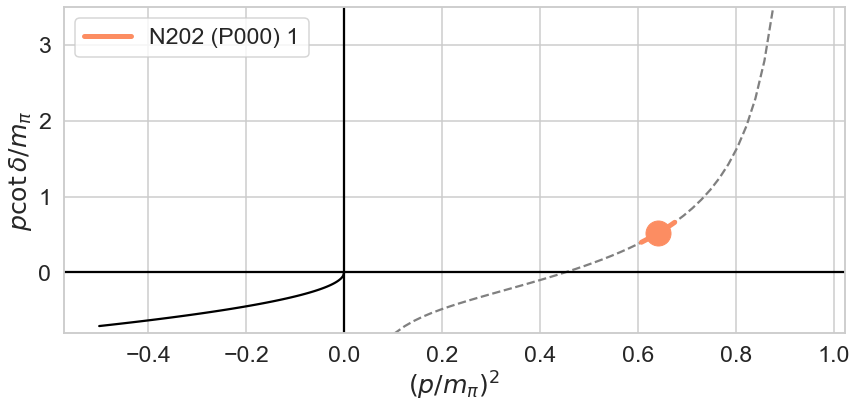

In [49]:
label = 'N202'
frame = 'P000'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.05, 0.950), ylim=(-0.8, 3.5))

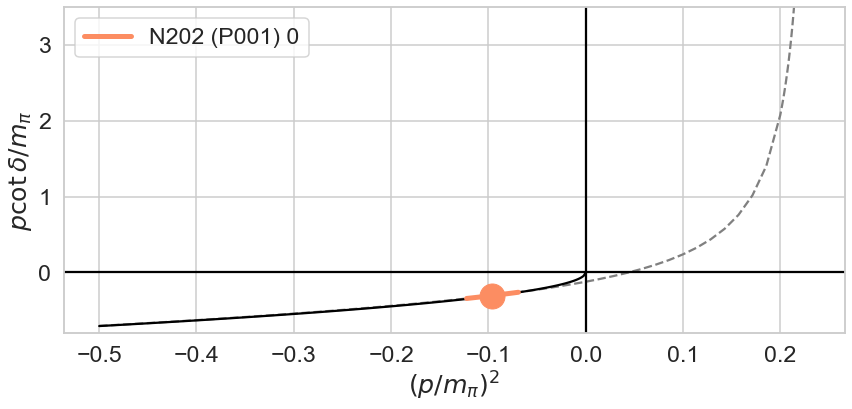

In [50]:
label = 'N202'
frame = 'P001'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.5, 0.2), np.linspace(0.2, 0.23)]), ylim=(-0.8, 3.5))

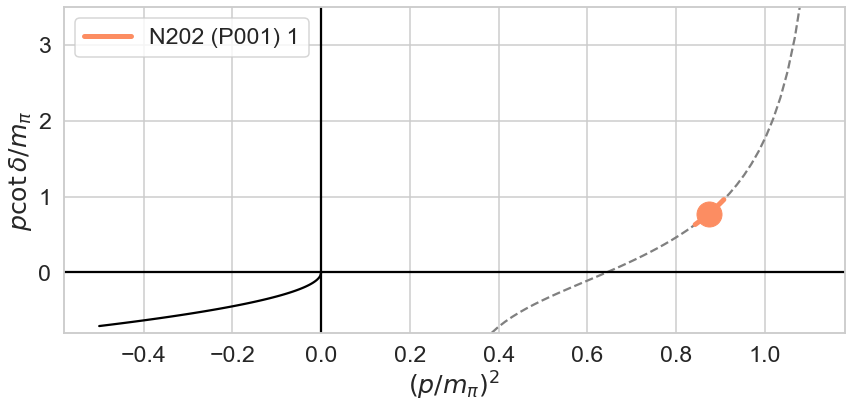

In [51]:
label = 'N202'
frame = 'P001'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.linspace(0.3, 1.1), ylim=(-0.8, 3.5))

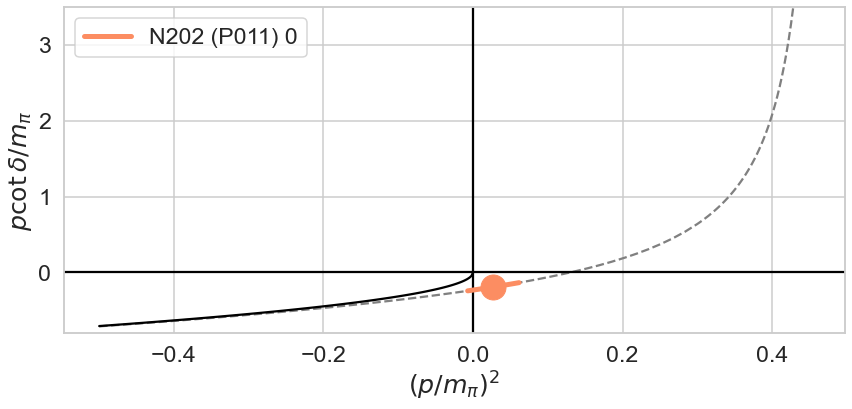

In [52]:
label = 'N202'
frame = 'P011'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.5, 0.3), np.linspace(0.3, 0.45)]), ylim=(-0.8, 3.5))

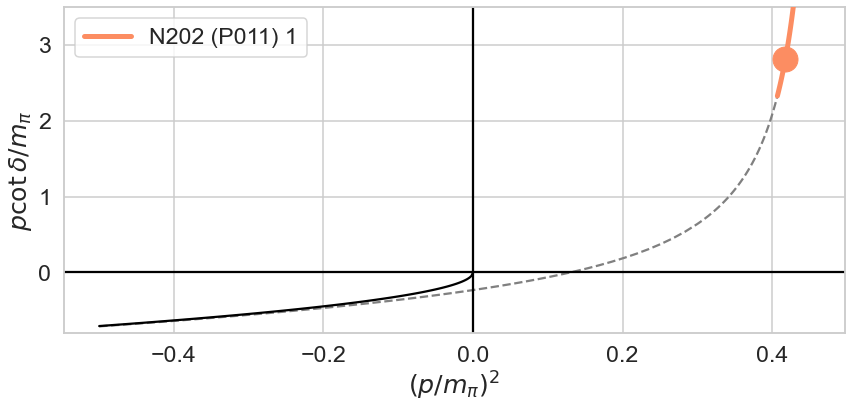

In [53]:
label = 'N202'
frame = 'P011'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.5, 0.3), np.linspace(0.3, 0.45)]), ylim=(-0.8, 3.5))

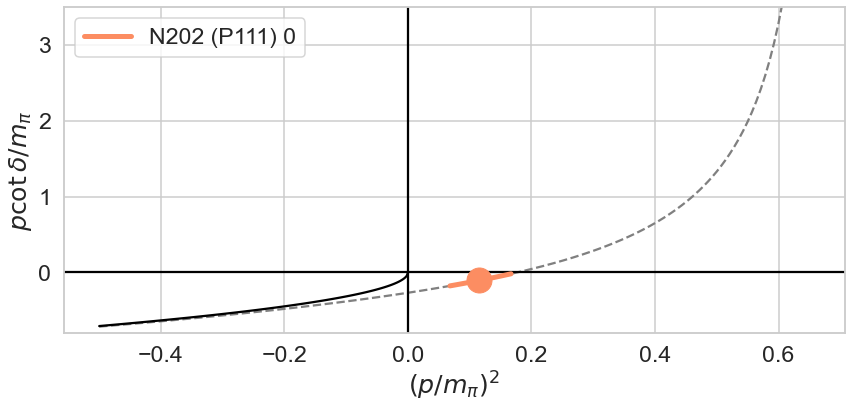

In [54]:
label = 'N202'
frame = 'P111'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.5, 0.3), np.linspace(0.3, 0.65)]), ylim=(-0.8, 3.5))

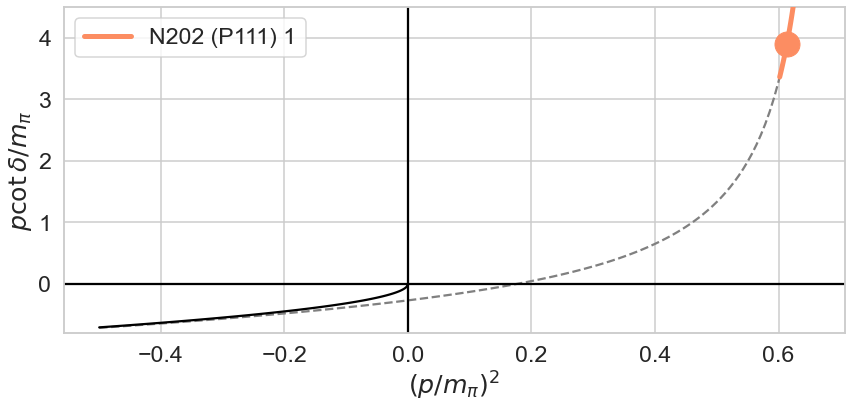

In [55]:
label = 'N202'
frame = 'P111'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.5, 0.3), np.linspace(0.3, 0.65)]), ylim=(-0.8, 4.5))

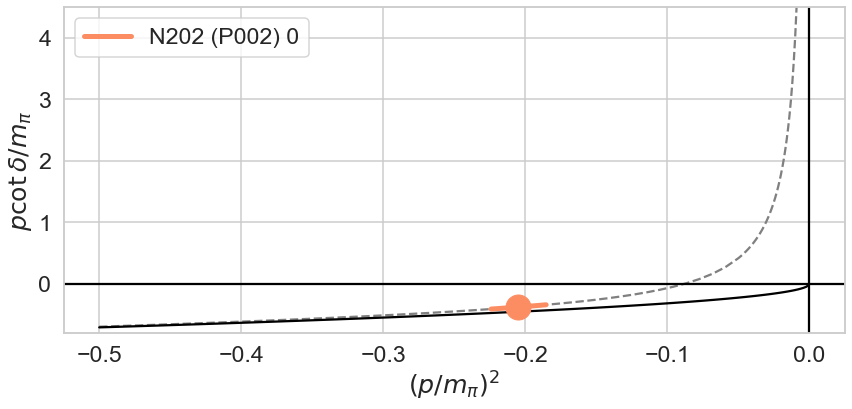

In [56]:
label = 'N202'
frame = 'P002'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.concatenate([np.linspace(-0.5, -0.05),
                                                                                           np.linspace(-0.05,-1e-3)]), ylim=(-0.8, 4.5))

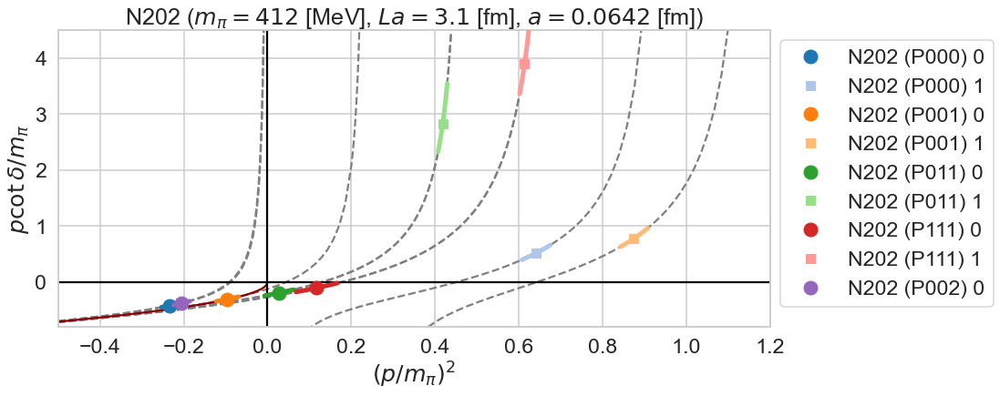

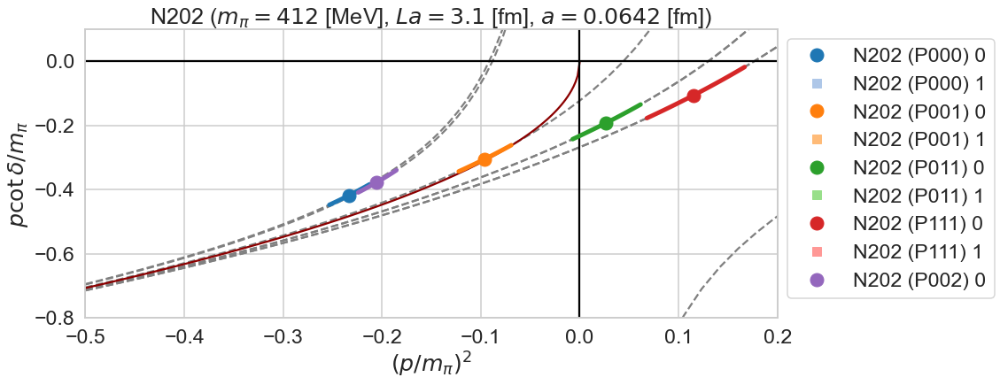

In [57]:
save_pcot_vs_p2(ld_dic, label0='N202', fit_param_list=[((-0.5, 1.2),(-0.8,4.5),''), ((-0.5,0.2),(-0.8,0.1),'_neg')])

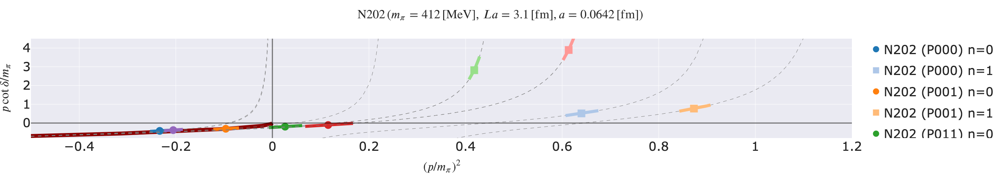

In [58]:
#save_pcot_vs_p2(ld_dic, label0='N202', fit_param_list=[((-0.5, 1.2),(-0.8,4.5),''), ((-0.5,0.2),(-0.8,0.1),'_neg')])
plotly_pcot_vs_p2(ld_dic, label0='N202', xlim=(-0.5,1.2), ylim=(-0.8,4.5))

# H101 -- $L = 2.8$ fm & $a = 0.0865$ fm

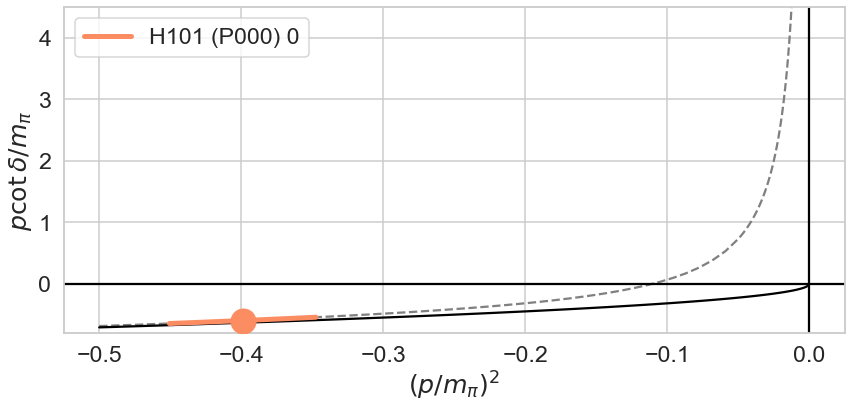

In [59]:
label = 'H101'
frame = 'P000'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.concatenate([np.linspace(-0.5, -0.05),
                                                                                           np.linspace(-0.05,-1e-3)]), ylim=(-0.8, 4.5))

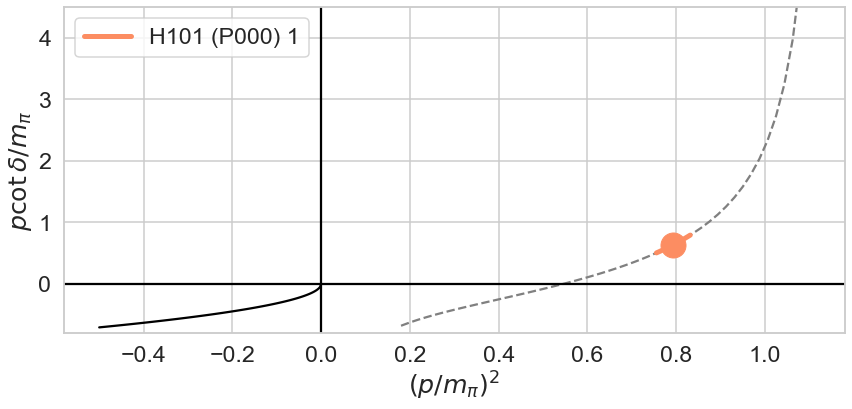

In [60]:
label = 'H101'
frame = 'P000'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.18, 1.1), ylim=(-0.8, 4.5))

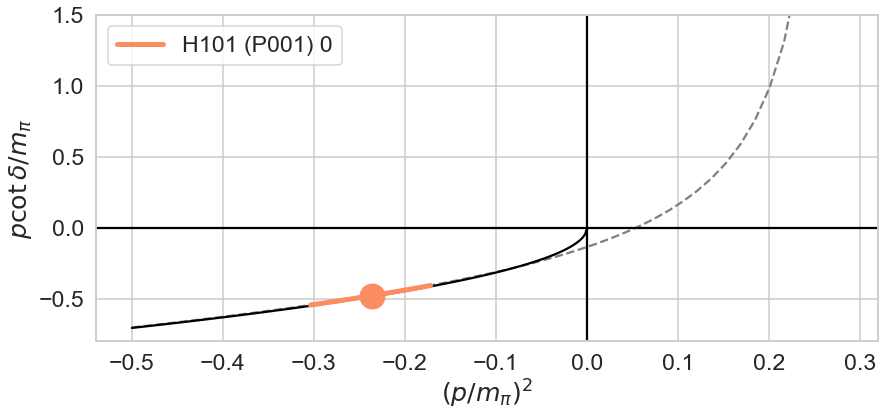

In [61]:
label = 'H101'
frame = 'P001'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.28), ylim=(-0.8, 1.5))

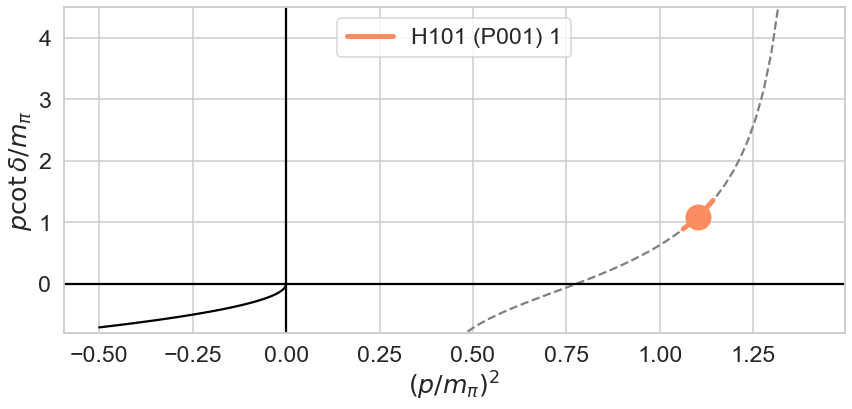

In [62]:
label = 'H101'
frame = 'P001'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.4, 1.4), ylim=(-0.8, 4.5))

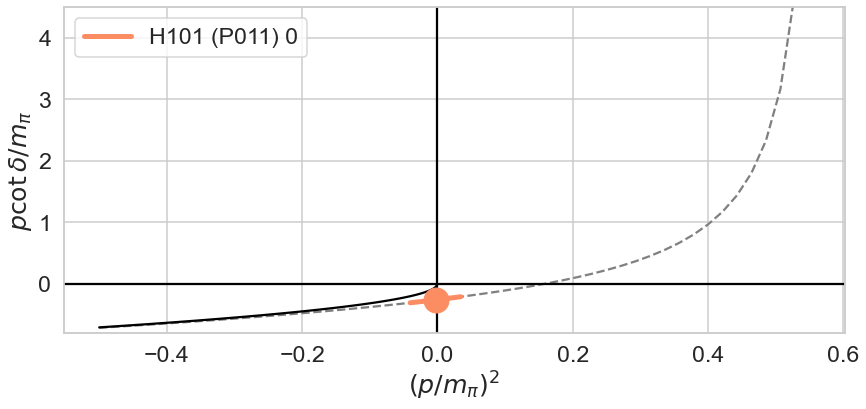

In [63]:
label = 'H101'
frame = 'P011'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.55), ylim=(-0.8, 4.5))

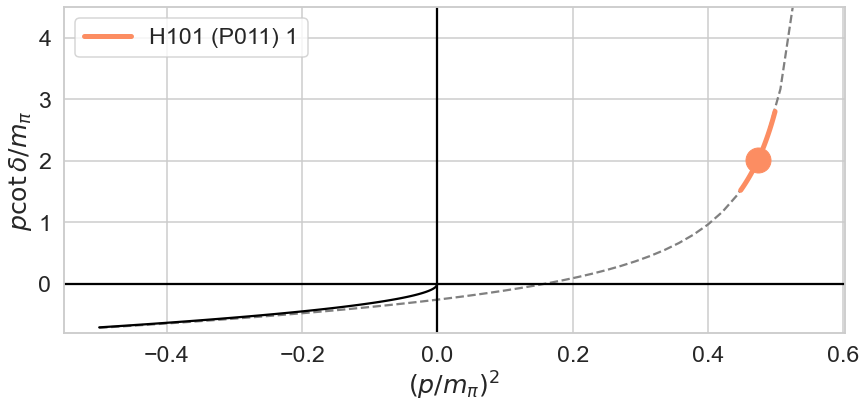

In [64]:
label = 'H101'
frame = 'P011'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.55), ylim=(-0.8, 4.5))

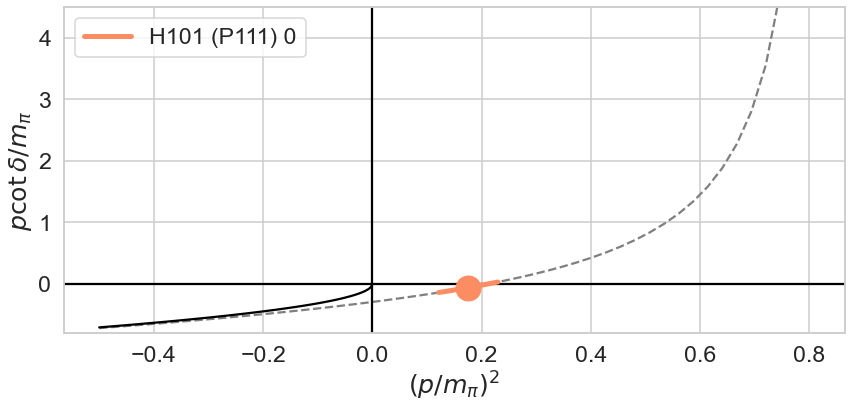

In [65]:
label = 'H101'
frame = 'P111'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.80), ylim=(-0.8, 4.5))

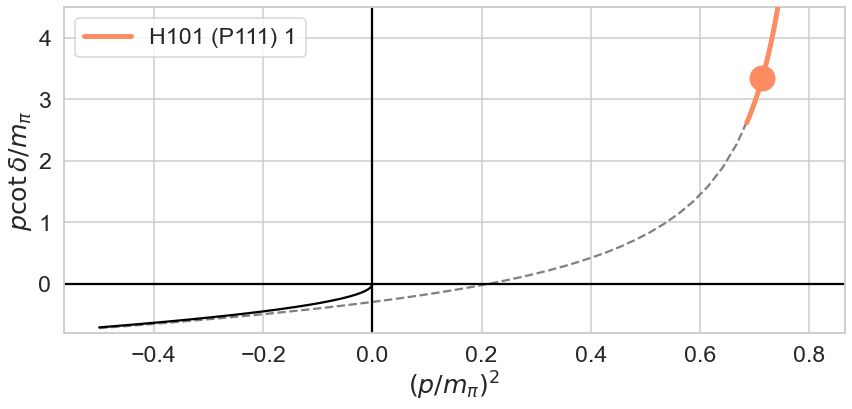

In [66]:
label = 'H101'
frame = 'P111'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.5, 0.80), ylim=(-0.8, 4.5))

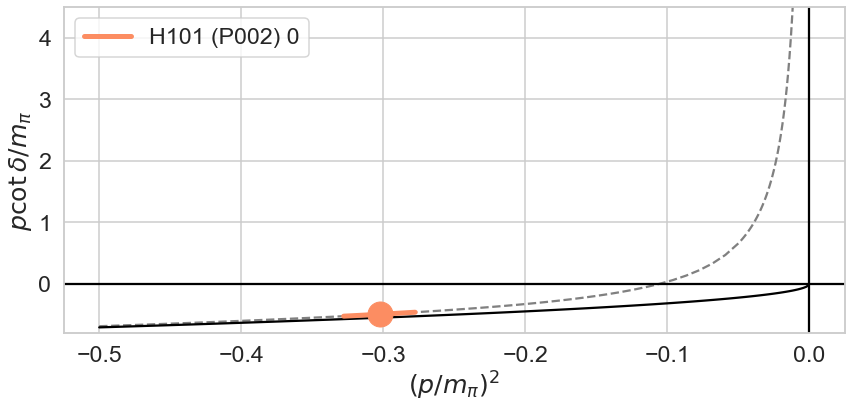

In [67]:
label = 'H101'
frame = 'P002'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.concatenate([np.linspace(-0.5, -0.05),
                                                                                           np.linspace(-0.05,-1e-3)]), ylim=(-0.8, 4.5))

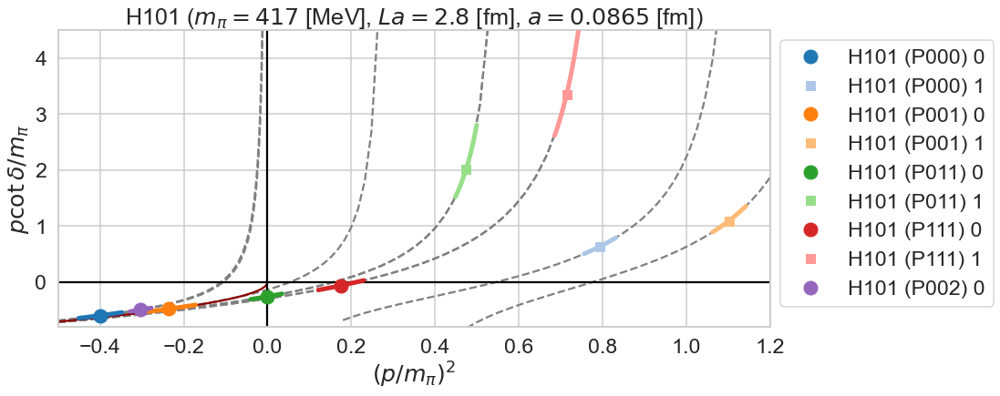

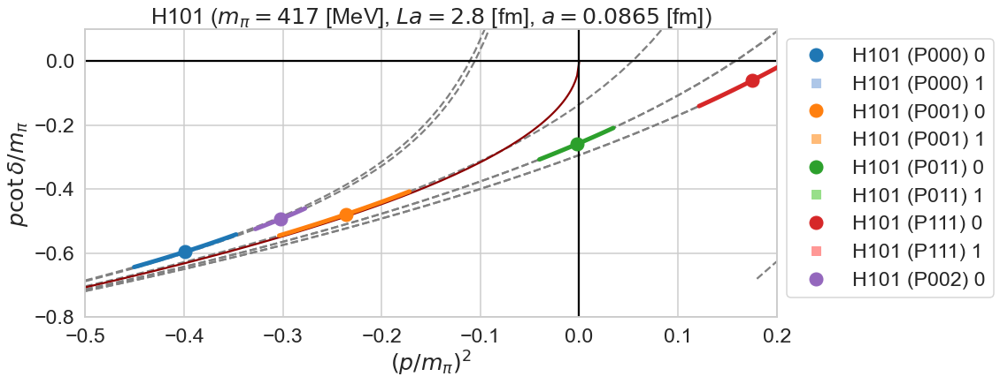

In [68]:
save_pcot_vs_p2(ld_dic, label0='H101', fit_param_list=[((-0.5, 1.2),(-0.8,4.5),''), ((-0.5,0.2),(-0.8,0.1),'_neg')])
#plotly_pcot_vs_p2(ld_dic, label0='N202', xlim=(-0.5,1.2), ylim=(-0.8,4.5))

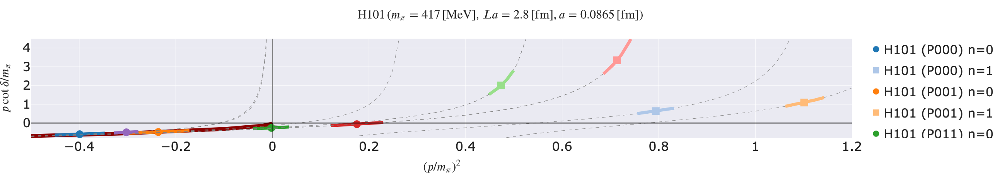

In [69]:
#save_pcot_vs_p2(ld_dic, label0='H101', fit_param_list=[((-0.5, 1.2),(-0.8,4.5),''), ((-0.5,0.2),(-0.8,0.1),'_neg')])
plotly_pcot_vs_p2(ld_dic, label0='H101', xlim=(-0.5,1.2), ylim=(-0.8,4.5))

# H200 --- $L = 2.1$ fm & $a = 0.0642$ fm

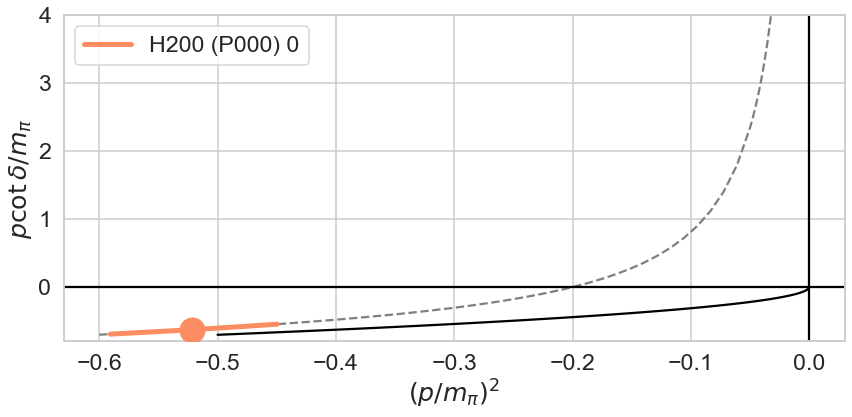

In [70]:
label = 'H200'
frame = 'P000'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.6, -0.05), np.linspace(-0.05, -1e-3)]), ylim=(-0.8, 4.0))

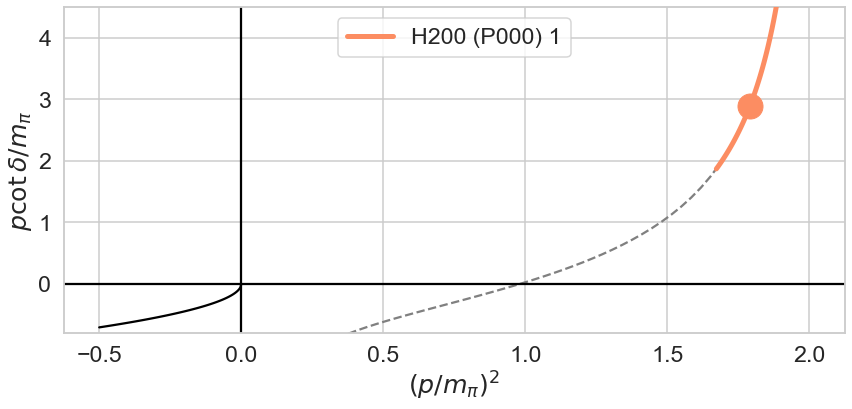

In [71]:
label = 'H200'
frame = 'P000'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.3, 2.), ylim=(-0.8, 4.5))

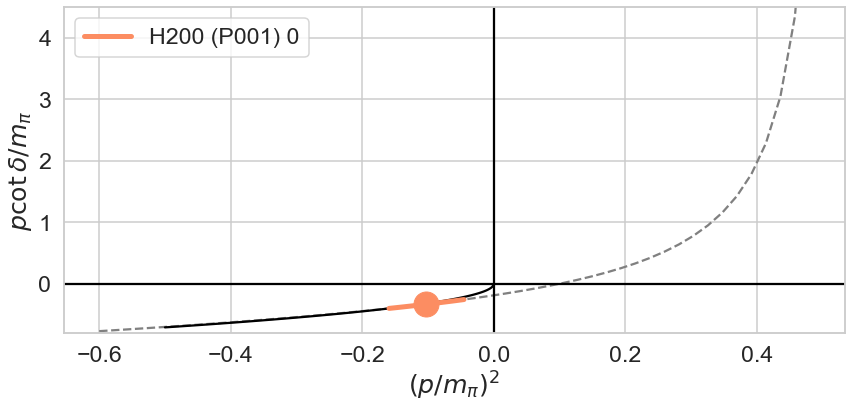

In [72]:
label = 'H200'
frame = 'P001'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 0.48), ylim=(-0.8, 4.5))

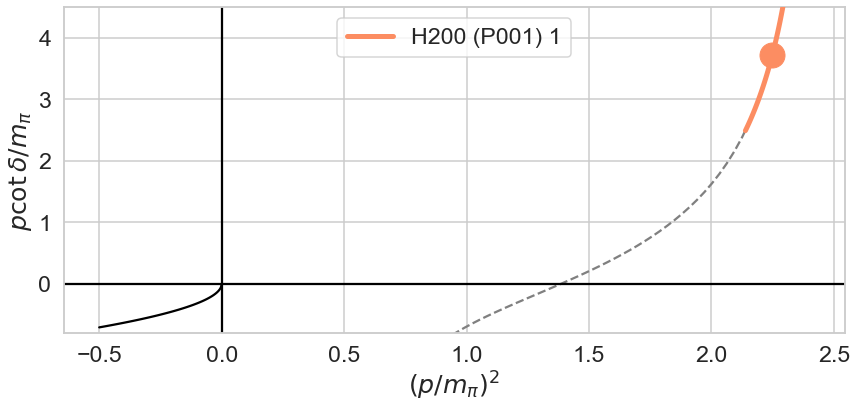

In [73]:
label = 'H200'
frame = 'P001'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.9, 2.4), ylim=(-0.8, 4.5))

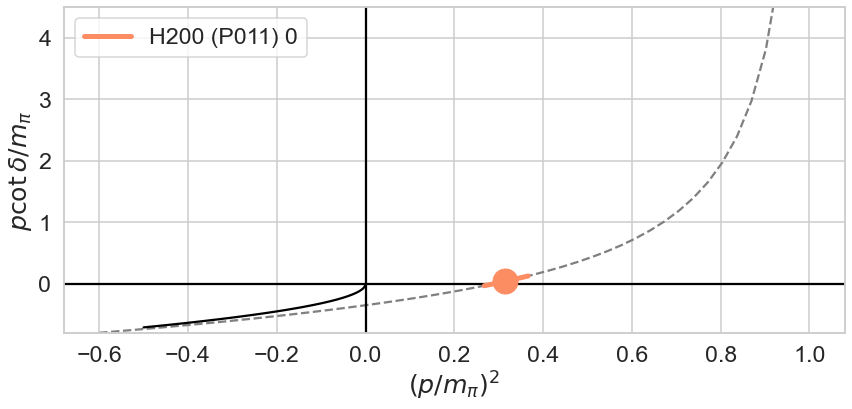

In [74]:
label = 'H200'
frame = 'P011'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 1.0), ylim=(-0.8, 4.5))

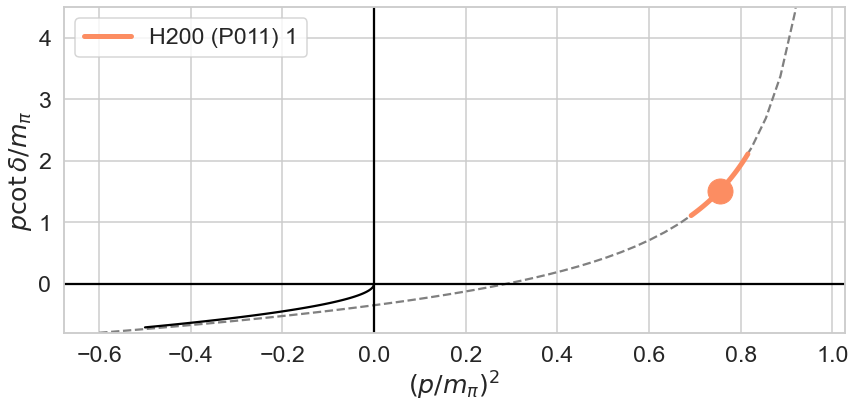

In [75]:
label = 'H200'
frame = 'P011'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 0.95), ylim=(-0.8, 4.5))

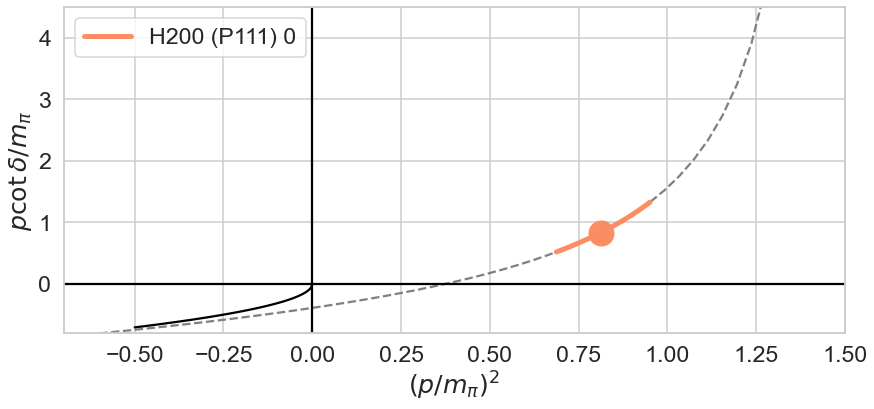

In [76]:
label = 'H200'
frame = 'P111'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 1.4), ylim=(-0.8, 4.5))

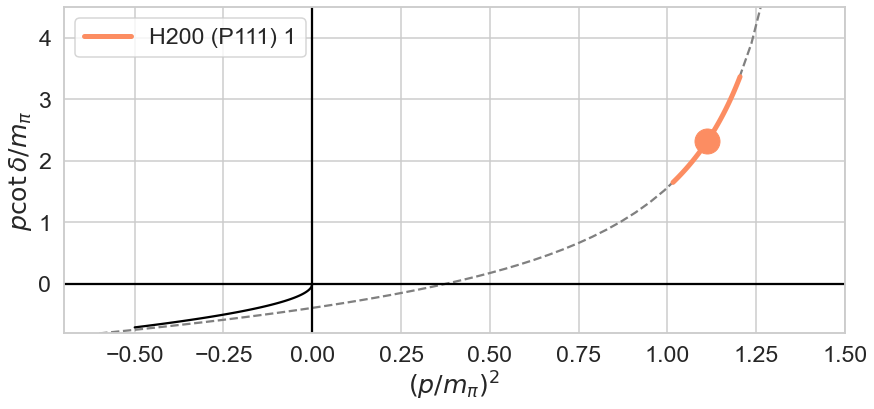

In [77]:
label = 'H200'
frame = 'P111'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 1.4), ylim=(-0.8, 4.5))

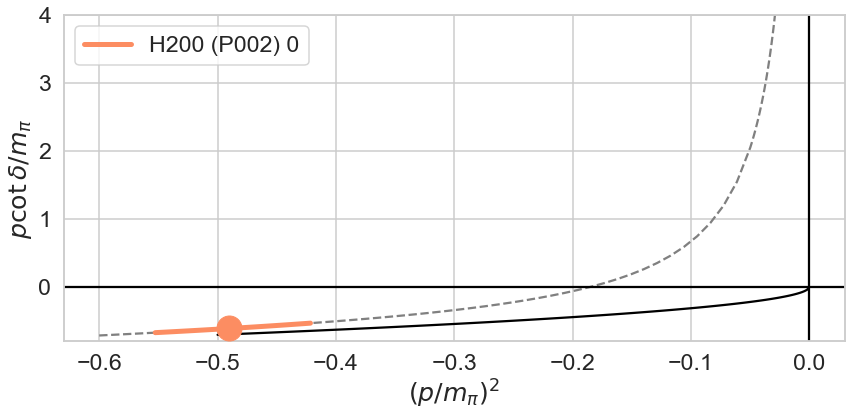

In [78]:
label = 'H200'
frame = 'P002'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.6, -0.05), np.linspace(-0.05, -1e-3)]), ylim=(-0.8, 4.0))

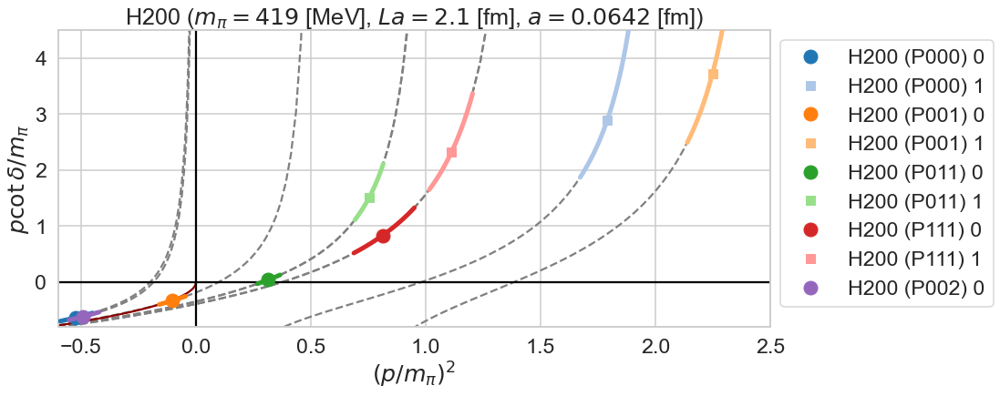

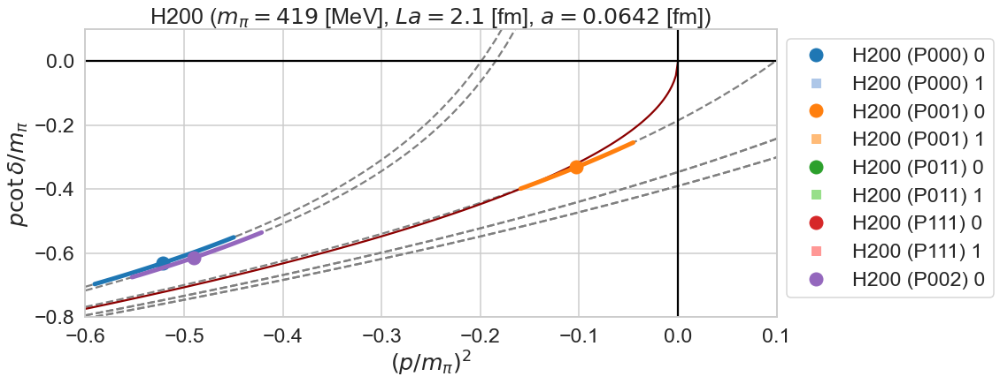

In [79]:
save_pcot_vs_p2(ld_dic, label0='H200', fit_param_list=[((-0.6, 2.5),(-0.8,4.5),''), ((-0.6,0.1),(-0.8,0.1),'_neg')])
#plotly_pcot_vs_p2(ld_dic, label0='H101', xlim=(-0.5,1.2), ylim=(-0.8,4.5))

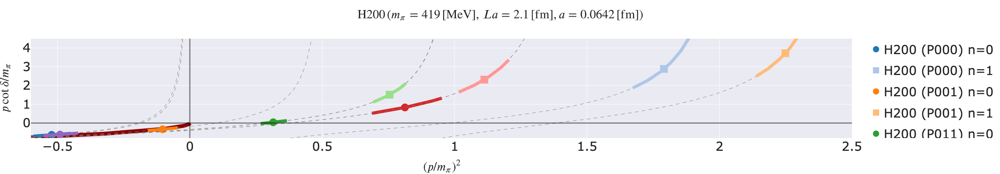

In [80]:
#save_pcot_vs_p2(ld_dic, label0='H200', fit_param_list=[((-0.6, 2.5),(-0.8,4.5),''), ((-0.6,0.1),(-0.8,0.1),'_neg')])
plotly_pcot_vs_p2(ld_dic, label0='H200', xlim=(-0.6,2.5), ylim=(-0.8,4.5))

# U103 --- $L = 2.1$ fm & $a = 0.0865$ fm

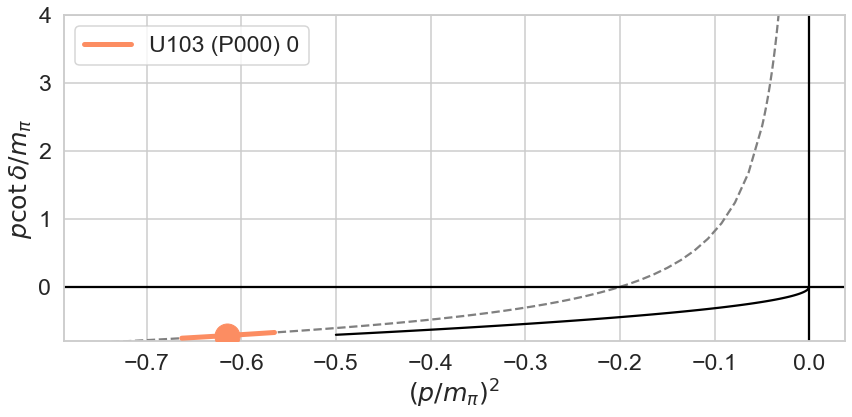

In [81]:
label = 'U103'
frame = 'P000'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.75, -0.05), np.linspace(-0.05, -1e-3)]), ylim=(-0.8, 4.0))

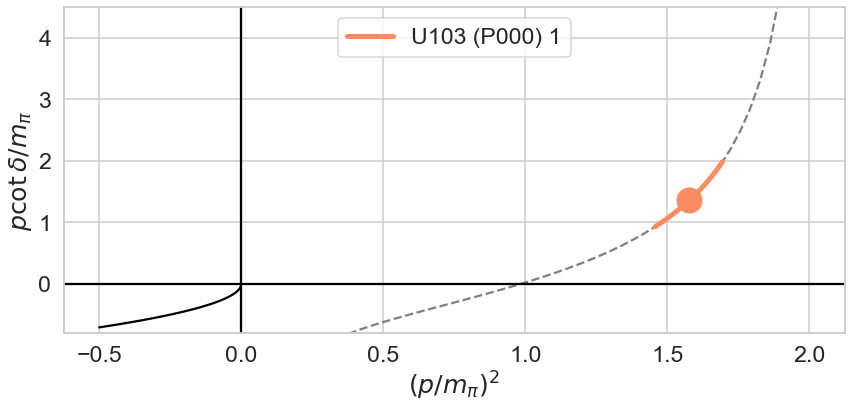

In [82]:
label = 'U103'
frame = 'P000'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.3, 2.), ylim=(-0.8, 4.5))

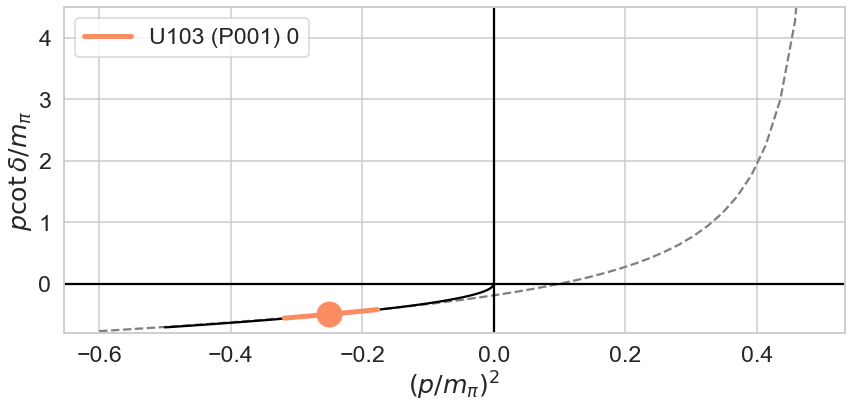

In [83]:
label = 'U103'
frame = 'P001'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 0.48), ylim=(-0.8, 4.5))

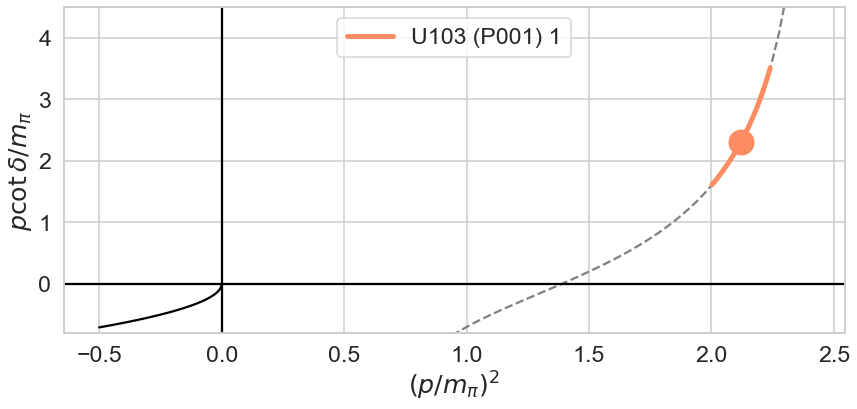

In [84]:
label = 'U103'
frame = 'P001'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(0.9, 2.4), ylim=(-0.8, 4.5))

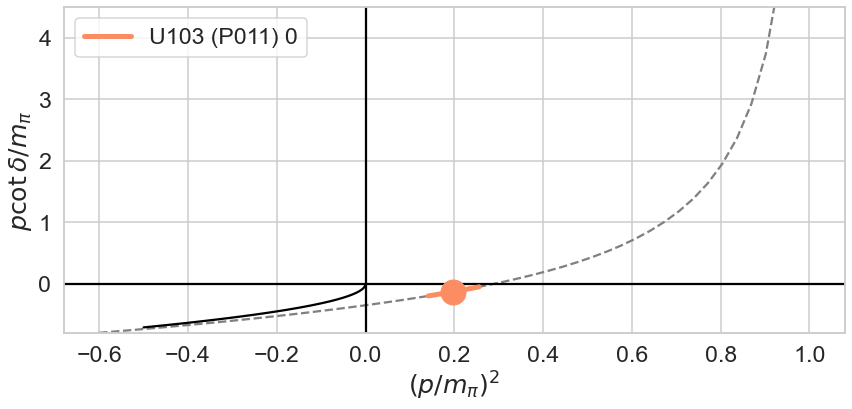

In [85]:
label = 'U103'
frame = 'P011'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 1.0), ylim=(-0.8, 4.5))

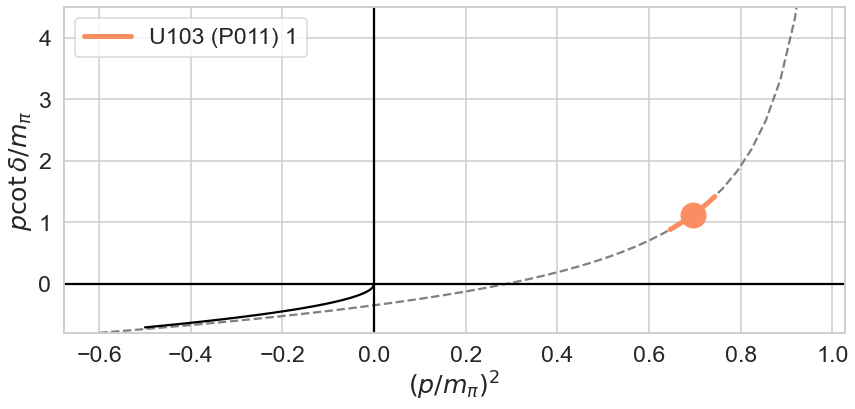

In [86]:
label = 'U103'
frame = 'P011'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 0.95), ylim=(-0.8, 4.5))

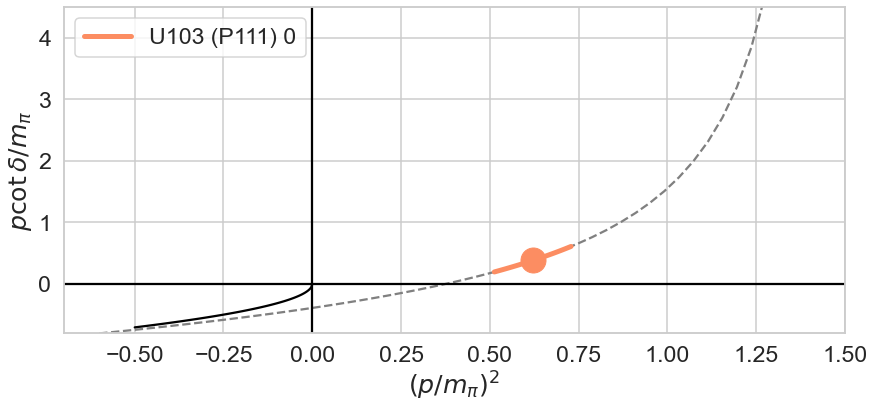

In [87]:
label = 'U103'
frame = 'P111'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 1.4), ylim=(-0.8, 4.5))

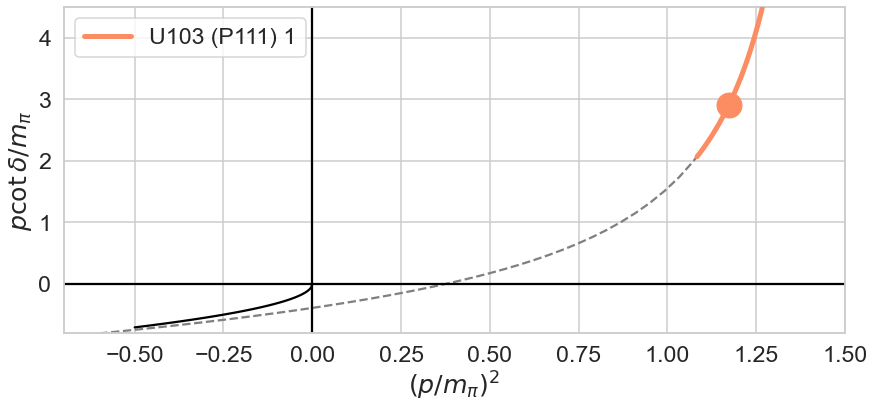

In [88]:
label = 'U103'
frame = 'P111'
level = 1
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, xrefs=np.linspace(-0.6, 1.4), ylim=(-0.8, 4.5))

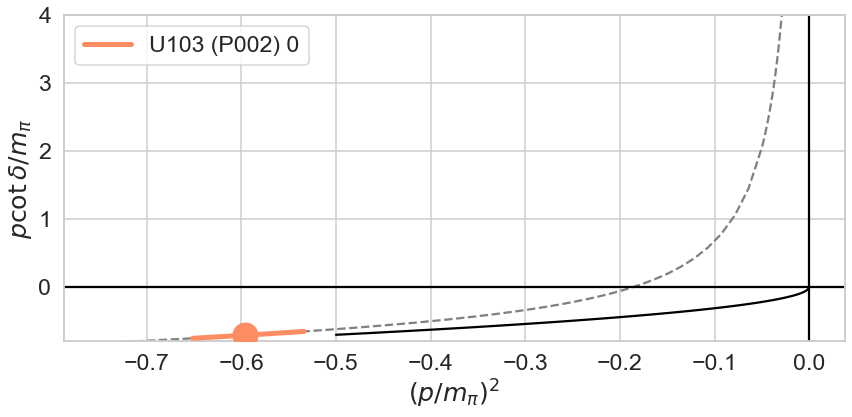

In [89]:
label = 'U103'
frame = 'P002'
level = 0
ld_dic[(label, frame, level)] = calc_kcot_vs_k2(label, frame, level, 
                                                xrefs=np.concatenate([np.linspace(-0.75, -0.05), np.linspace(-0.05, -1e-3)]), ylim=(-0.8, 4.0))

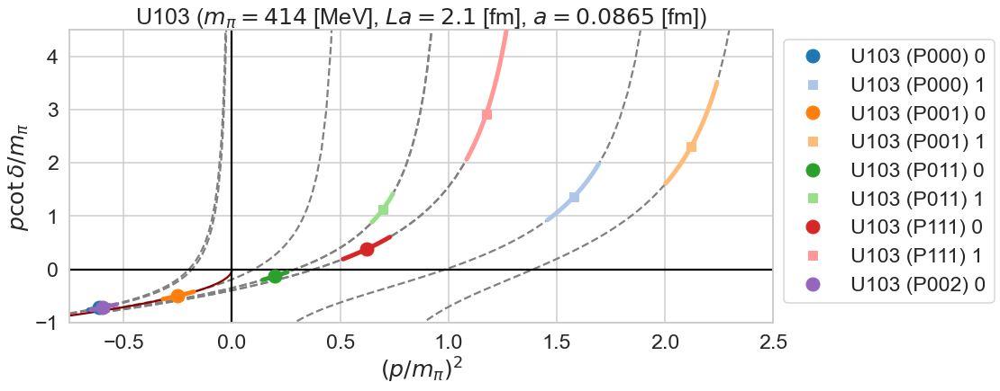

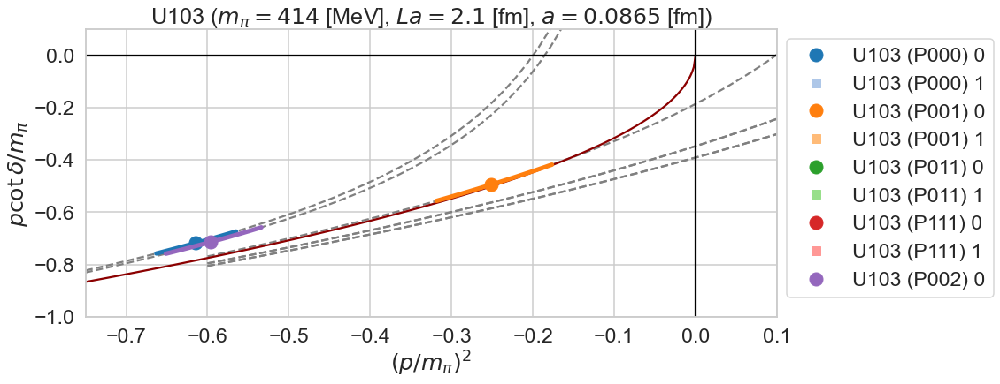

In [90]:
save_pcot_vs_p2(ld_dic, label0='U103', fit_param_list=[((-0.75, 2.5),(-1,4.5),''), ((-0.75, 0.1),(-1,0.1),'_neg')])


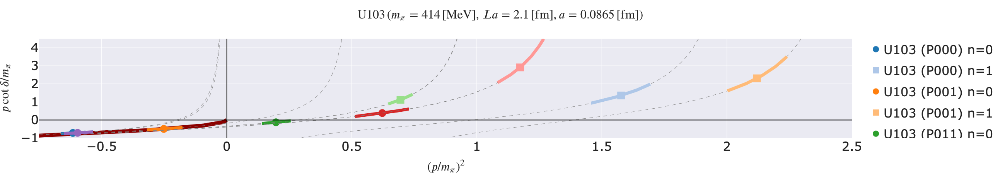

In [91]:
plotly_pcot_vs_p2(ld_dic, label0='U103', xlim=(-0.75,2.5), ylim=(-1,4.5))